## NLP Analysis on Data Science News Article Corpus

### Summary
This project aims to analyze news articles on Data Science, Machine Learning and Artificial Intelligence, and extract meaningful insights from unstructured text corpus. The objectives are to identify job lines/industries that are mostly impacted by AI and provide recommendations to promote AI development and integration in the future.

### Data
~200K+ news articles

_downloading data: df_news_final_project = pd.read_parquet('https://storage.googleapis.com/msca-bdp-data-open/news_final_project/news_final_project.parquet', engine='pyarrow')_

### Project Sections

1. Topic Modeling

  - Used _ktrain_ to identify key topics and key words within each topic.

  - Closely analyzed each topic through text summarization to identify highly AI-relevant topics.

2. Sentiment Analysis

  - Trained a customized sentiment analysis model from Yelp reviews data.

  - Used the model to identify sentences with extreme sentiments(positive/negative) for each AI-relevant topic.

  - From sentences with extreme sentiments, identified jobs that are mostly impacted by AI.

  - Plotted timelines to illustrate how the sentiments changed over time for those jobs.

3. Name Entity Recognition

 - Used _spacy_ to extract technology entities

 - Agggregated entities by counts to identify the technologies that are commonly mentioned in the articles.

 - Plotted timelines to illustrate the introduction of these technologies.

4. Targeted Sentiment Identification

 - Analyzed positive sentiments around various industries to identify companies that are likely to invest in AI technology(successes).

 - Analyzed negative sentiments around certain field/applications to identify applications that cannot be transformed by AI based on today's state of technology(failures).

 - Visualized key words with extreme sentiments in word cloud.

### Author and Platform

Yezi Liu conducted this project independently using Colab.


_**Note: for the core business insights, key conclusions, and recommendations from this project, please see the PDF Presentation Slides named "DS_article_nlp_analysis.pdf" in the same repository.**_

## Load Packages

In [ ]:
# Running this cell may make changes to your environment

# !pip install sumy
# !pip install -U spacy
# !python -m spacy download en_core_web_md
# %pip install spacy
# %pip install ktrain==0.37.6

In [ ]:
import pandas as pd
import os
import sys
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import matplotlib.pyplot as plt
import re
import gensim
from gensim.corpora.dictionary import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from gensim.models.ldamodel import LdaModel
from gensim import corpora
from transformers import pipeline
import textwrap
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import make_pipeline
import numpy as np
import joblib
from spacy.matcher import Matcher
from collections import Counter
import ktrain
from wordcloud import WordCloud
from sumy.parsers.plaintext import PlaintextParser
from sumy.nlp.tokenizers import Tokenizer
from sumy.summarizers.lex_rank import LexRankSummarizer
import spacy

nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')
os.system(f"{sys.executable} -m pip install pyarrow")

## Set Up Environmental Variables

In [ ]:
# environmental variables
DATA_PATH = 'https://storage.googleapis.com/msca-bdp-data-open/news_final_project/news_final_project.parquet'

os.makedirs('/home/jupyter/yelp', exist_ok=True)
os.makedirs('/home/jupyter/data/yelp/yelp_model', exist_ok=True)
directory = 'https://storage.googleapis.com/msca-bdp-data-open/yelp/'
fileName = 'yelp_train_sentiment.json'
YELP_PATH = directory + fileName

LOG_REG_MODEL_PATH = '/content/drive/My Drive/log_reg_model.joblib'

## 1. Topic Modeling

### 1.1 Functions Used

In [ ]:
def cleaned_news(text, max_length=18, min_length=3):
  """
  This function cleans the news article by removing various special characters & punctuations & numbers,
  lowercasing and lemmatizing tokens, removing stop words, and remove unusually long or short tokens as well.
  """
  text = re.sub(r'(?:\@|http?\://|https?\://|www)\S+', '', text)
  # Replace newlines and tabs
  text = re.sub(r'[\n\t]+', ' ', text)
  # Remove HTML tags
  text = re.sub(r'<[^>]+>', '', text)
  text = re.sub(r'\d+', '', text)
  tokens = nltk.tokenize.word_tokenize(text)
  return ' '.join([lemma.lemmatize(token.lower()) for token in tokens
      if token.lower() not in stop_words
      and token.isalpha()
      and not token.isnumeric()
      # Since in the actual text, there are many unusually long tokens(several words connected together without a space),
      # such as readsoffersnewfind, usually from web-related buttons or ads on a specific web page and are unrelated to the news article contents.
      # So I set up token maximum and minimum lengths.
      and len(token) <= max_length
      and len(token) >= min_length])

In [ ]:
def lexrank_summarize(text, summary_sentence_count=3):
  """
  This function summarizes the text.
  """
  parser = PlaintextParser.from_string(text, Tokenizer("english"))
  summarizer = LexRankSummarizer()
  summary = summarizer(parser.document, summary_sentence_count)
  summary_text = " ".join([str(sentence) for sentence in summary])
  return summary_text

### 1.2 Load & Prepare Data

In [ ]:
%%time
df = pd.read_parquet(DATA_PATH, engine='pyarrow')
df.shape

CPU times: user 6.57 s, sys: 5.99 s, total: 12.6 s
Wall time: 43.4 s


(200435, 5)

In [ ]:
df = df[df['language']=='en'].reset_index(drop=True)
df.head()

,url,date,language,title,text
0,http://galusaustralis.com/2020/02/486473/legal...,2020-02-26,en,LegalTech Artificial Intelligence Market 2019 ...,LegalTech Artificial Intelligence Market 2019 ...
1,http://newsparliament.com/2020/02/27/children-...,2020-02-27,en,Children With Autism Saw Their Learning and So...,\nChildren With Autism Saw Their Learning and ...
2,http://www.agoravox.it/Covid-19-un-messaggio-d...,2020-03-13,en,Covid-19: un messaggio dai ricercatori italian...,\n\n\nCovid-19: un messaggio dai ricercatori i...
3,http://www.desototimes.com/news/child-actor-cl...,2022-06-09,en,Child actor Claude Jarman Jr. looks back on hi...,\nChild actor Claude Jarman Jr. looks back on ...
4,http://www.millenniumpost.in/big-stories/ai-ex...,2020-08-07,en,Two dead as AI Express flight skids off Kozhik...,Two dead as AI Express flight skids off Kozhik...


In [ ]:
# filter out articles that contain key words related to AI, machine learning, data science, etc to narrow the analysis scope.
pattern = r'(?i)\b(AI|artificial intelligence|machine learning|deep learning|neural networks|data science)\b'

In [ ]:
df = df[df['text'].str.contains(pattern, na=False)]
df.shape

<ipython-input-7-c3dd8d5f3952>:1: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df = df[df['text'].str.contains(pattern, na=False)]


(192323, 5)

In [ ]:
stop_words = set(nltk.corpus.stopwords.words('english'))
lemma = WordNetLemmatizer()

In [ ]:
df['cleaned_text'] = df['text'].apply(lambda x: cleaned_news(x))
df.head()

,url,date,language,title,text,cleaned_text
0,http://galusaustralis.com/2020/02/486473/legal...,2020-02-26,en,LegalTech Artificial Intelligence Market 2019 ...,LegalTech Artificial Intelligence Market 2019 ...,legaltech artificial intelligence market techn...
1,http://newsparliament.com/2020/02/27/children-...,2020-02-27,en,Children With Autism Saw Their Learning and So...,\nChildren With Autism Saw Their Learning and ...,child autism saw learning social skill boosted...
2,http://www.agoravox.it/Covid-19-un-messaggio-d...,2020-03-13,en,Covid-19: un messaggio dai ricercatori italian...,\n\n\nCovid-19: un messaggio dai ricercatori i...,messaggio dai ricercatori italiani colleghi st...
4,http://www.millenniumpost.in/big-stories/ai-ex...,2020-08-07,en,Two dead as AI Express flight skids off Kozhik...,Two dead as AI Express flight skids off Kozhik...,two dead express flight skid kozhikode postbey...
5,http://www.nativestew.com/2023/11/ai-took-my-j...,2023-11-20,en,"Native Stew - Bahamas AI Art, Photos, Videos: ...","\nNative Stew - Bahamas AI Art, Photos, Videos...",native stew bahamas art photo video took job p...


In [ ]:
cleaned_text = df['cleaned_text'].tolist()

### 1.3 Identify Key Topics & Key Words Using _ktrain_

In [ ]:
%%time
tm = ktrain.text.get_topic_model(
    texts=cleaned_text,
    n_topics=25,
    n_features=10000,
    min_df=100,
    max_df=0.5,
    stop_words='english',
    model_type='lda',
    lda_max_iter=20,
    verbose=1)

lang: en
preprocessing texts...
fitting model...
iteration: 1 of max_iter: 20
iteration: 2 of max_iter: 20
iteration: 3 of max_iter: 20
iteration: 4 of max_iter: 20
iteration: 5 of max_iter: 20
iteration: 6 of max_iter: 20
iteration: 7 of max_iter: 20
iteration: 8 of max_iter: 20
iteration: 9 of max_iter: 20
iteration: 10 of max_iter: 20
iteration: 11 of max_iter: 20
iteration: 12 of max_iter: 20
iteration: 13 of max_iter: 20
iteration: 14 of max_iter: 20
iteration: 15 of max_iter: 20
iteration: 16 of max_iter: 20
iteration: 17 of max_iter: 20
iteration: 18 of max_iter: 20
iteration: 19 of max_iter: 20
iteration: 20 of max_iter: 20
done.
CPU times: user 3h 38min 47s, sys: 9h 36min 20s, total: 13h 15min 7s
Wall time: 1h 46min 3s


In [ ]:
tm.print_topics()

topic 0 | public schedule radio music program community facebook search twitter email
topic 1 | government risk security president regulation public biden country agency national
topic 2 | nvidia chip edge computer computing vision application device software solution
topic 3 | ago hour video weather story day app file sport search
topic 4 | comment january september december november august october july june february
topic 5 | customer cloud generative enterprise digital solution platform management organization partner
topic 6 | statement release risk result investment fund future press distribution including
topic 7 | health patient medical healthcare care clinical cancer disease drug medicine
topic 8 | communication law security digi legal financial share cybersecurity transaction announces
topic 9 | user search product feature experience tool marketing website platform cooky
topic 10 | gray release press alert prnewswire platform solution weather music country
topic 11 | star look

In [ ]:
# Save the topic model to Google Drive
tm.save('/content/drive/My Drive/ktrain_lda_model')

In [ ]:
%%time
tm.build(cleaned_text, threshold=0.25)

done.
CPU times: user 11min 15s, sys: 22min 14s, total: 33min 29s
Wall time: 6min 44s


In [ ]:
# List topics by document counts
tm.print_topics(show_counts=True)

topic:10 | count:29982 | gray release press alert prnewswire platform solution weather music country
topic:21 | count:14651 | chatgpt like image people say work tool human model way
topic:3 | count:11805 | ago hour video weather story day app file sport search
topic:5 | count:11109 | customer cloud generative enterprise digital solution platform management organization partner
topic:17 | count:10447 | market global analysis growth research forecast key trend player size
topic:19 | count:9838 | india share price story video read latest sport live entertainment
topic:9 | count:8239 | user search product feature experience tool marketing website platform cooky
topic:12 | count:8007 | model human machine learning potential process algorithm task need risk
topic:1 | count:7938 | government risk security president regulation public biden country agency national
topic:16 | count:7585 | openai microsoft google tech ceo chatgpt altman icon billion musk
topic:15 | count:6831 | stock market nasda

In [ ]:
tm.visualize_documents(doc_topics=tm.get_doctopics())

reducing to 2 dimensions...[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 179978 samples in 0.003s...
[t-SNE] Computed neighbors for 179978 samples in 38.617s...
[t-SNE] Computed conditional probabilities for sample 1000 / 179978
[t-SNE] Computed conditional probabilities for sample 2000 / 179978
[t-SNE] Computed conditional probabilities for sample 3000 / 179978
[t-SNE] Computed conditional probabilities for sample 4000 / 179978
[t-SNE] Computed conditional probabilities for sample 5000 / 179978
[t-SNE] Computed conditional probabilities for sample 6000 / 179978
[t-SNE] Computed conditional probabilities for sample 7000 / 179978
[t-SNE] Computed conditional probabilities for sample 8000 / 179978
[t-SNE] Computed conditional probabilities for sample 9000 / 179978
[t-SNE] Computed conditional probabilities for sample 10000 / 179978
[t-SNE] Computed conditional probabilities for sample 11000 / 179978
[t-SNE] Computed conditional probabilities for sample 12000 / 179978
[t-SNE] 

**Topics that are likely to be top candidates for AI integration:**

topic:21 | count:14651 | chatgpt like image people say work tool human model way

topic:5 | count:11109 | customer cloud generative enterprise digital solution platform management organization partner

topic:12 | count:8007 | model human machine learning potential process algorithm task need risk

topic:16 | count:7585 | openai microsoft google tech ceo chatgpt altman icon billion musk

topic:7 | count:6172 | health patient medical healthcare care clinical cancer disease drug medicine

topic:23 | count:5108 | science learning student research university education machine scientist researcher school

topic:2 | count:4749 | nvidia chip edge computer computing vision application device software solution

topic:14 | count:2038 | best insurance crypto online casino credit paid buy program bitcoin

topic:18 | count:1587 | energy china vehicle global car robot supply digital climate industrial

topic:8 | count:1313 | communication law security digi legal financial share cybersecurity transaction announces

topic:15 | count:6831 | stock market nasdaq share price trading investor symbol fund etf

I would analyze each topics closely next.

### 1.4 Analyze Each Topic to Further Identify Highly AI-Relevant Ones

#### Topic 21

In [ ]:
topic21_keywords = ['chatgpt', 'like', 'image', 'people', 'say', 'work', 'tool', 'human', 'model', 'way',
                    'ai']

# Filter articles containing all keywords in topic21
topic21_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic21_keywords))]

In [ ]:
topic21_df = topic21_df.dropna(subset=['cleaned_text'])
sampled_21_articles = topic21_df.sample(n=10)

In [ ]:
# Summarize each sampled article
sampled_21_articles['summary'] = sampled_21_articles['text'].apply(lexrank_summarize)
sampled_21_articles.head(10)

,url,date,language,title,text,cleaned_text,summary
125031,https://gazette.com/news/us-world/exclusive-ch...,2022-12-15,en,Exclusive-ChatGPT owner OpenAI projects $1 bil...,\nExclusive-ChatGPT owner OpenAI projects $1 b...,owner openai project billion revenue world ski...,"GAZETTE PODCASTS | News, Sports, Cold Cases an..."
189765,https://www.entrepreneur.com/science-technolog...,2023-07-10,en,8 AI Trends and Predictions for the Next Decad...,\n\n\n 8 AI Trends and Predictions for the Nex...,trend prediction next decade entrepreneur skip...,8 AI Trends and Predictions for the Next Decad...
124758,https://www.timesnownews.com/technology-scienc...,2023-09-26,en,Digital Necromancy: AI Facilitates Communicati...,Digital Necromancy: AI Facilitates Communicati...,digital necromancy facilitates communication d...,Digital Necromancy: AI Facilitates Communicati...
94039,https://www.sandiegouniontribune.com/business/...,2023-07-12,en,Sarah Silverman and novelists sue ChatGPT-make...,\nSarah Silverman and...,sarah silverman novelist sue openai ingesting ...,The U.S. courts may now help sort that out aft...
96240,https://bigthink.com/the-future/ai-lie-detector/,2023-04-02,en,"A new AI lie detector can reveal its ""hidden t...",A new AI lie detector can reveal...,new lie detector reveal hidden thought big thi...,“We have a very limited and crude ability to l...
28574,https://www.latestly.com/technology/samsung-bl...,2023-05-03,en,Samsung Blocks AI Tools Like ChatGPT Use on Co...,\n\nSamsung Blocks AI Tools Like ChatGPT Use o...,samsung block tool like chatgpt use device dat...,"For more news and updates on politics, world, ..."
116715,https://www.christianitytoday.com/ct/2023/june...,2023-06-07,en,Pastors: Lead Not Your Church into Fear of AI ...,\nPastors: Lead Not Your Church into Fear of A...,pastor lead church fear christianity today jum...,View Issue Archives Subscribe CT Pastors Pasto...
159577,https://chiefexecutive.net/unleashing-your-ai-...,2023-05-09,en,Unleashing Your AI Advantage,\n\nUnleashing Your AI Advantage\n\n\r\n\r\n\r...,unleashing advantage skip content ceo insight ...,"What’s your take on AI in business, how it’s a..."
151523,https://www.tomsguide.com/news/wikipedia-found...,2023-11-14,en,Wikipedia founder warns against relying on Cha...,\n\nWikipedia founder warns against relying on...,wikipedia founder warns relying chatgpt make m...,He told the crowd “It is not good enough for a...
95248,https://www.zdnet.com/article/i-wanted-to-try-...,2023-02-12,en,I wanted to try the new Bing with ChatGPT. The...,\n\n\nI wanted to try the new Bing with ChatGP...,wanted try new bing chatgpt microsoft went mic...,"Microsoft ""But I haven't accessed the new Bing..."


In [ ]:
wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_21_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

Article 125032 Summary:
GAZETTE PODCASTS | News, Sports, Cold Cases and Lifestyle Sign up for our
newsletters and get news that matters sent to your inbox Email Print Copy
article link Save By Jeffrey Dastin, Krystal Hu and Paresh Dave(Reuters) -
ChatGPT, the new chatbot that is the talk of Silicon Valley, can spit out
haikus, crack jokes in Italian and may soon be the scourge of teachers
everywhere facing fake essays generated by the AI-powered technology.But a
question it can't fully answer is this: How will OpenAI make money?The research
organization, co-founded by Elon Musk and investor Sam Altman and backed by $1
billion in funding from Microsoft Corp, is expecting its business to surge.Three
sources briefed on OpenAI's recent pitch to investors said the organization
expects $200 million in revenue next year and $1 billion by 2024.The forecast,
first reported by Reuters, represents how some in Silicon Valley are betting the
underlying technology will go far beyond splashy and some

**Topic 21 important summaries:**

OpenAI has been deeply rooted in educational field(ex:fake essays). AI systems is developing the ability to not only learn but get exponentially better at learning and improving without explicit human intervention, leading to significant advancements in autonomous decision-making and problem-solving.AI also helps people who want to self-learn using the latest technology aids available to them.

AI advances enable "digital necromancy", allowing contact with the deceased via technology. AI is contributing to a new concept known as "digital necromancy," a phenomenon that allows individuals to communicate with the deceased through technology.

Literary and artist communities, like authors accuse AI of its exploitative practices in building chatbots that “mimic and regurgitate” their language, style and ideas(copyright infringement).

Scammers can use AI to create audio that sounds like the pastor or church leader asking for money and use it to make calls to unsuspecting parishioners.

#### _Note: for later topics, the printed output of article summaries are omitted to save space and only several important summary sentences are listed._

#### Topic 5

In [ ]:
topic5_keywords = ['customer', 'cloud', 'generative', 'enterprise', 'digital', 'solution', 'platform',
                   'management', 'organization', 'partner', 'ai']

# Filter articles containing all keywords in topic5
topic5_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic5_keywords))]

In [ ]:
topic5_df = topic5_df.dropna(subset=['cleaned_text'])
sampled_5_articles = topic5_df.sample(n=10)
sampled_5_articles['summary'] = sampled_5_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)
for i, row in sampled_5_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Topic 5 important summaries:**

Marketing Cloud's PRophet, the first and only generative and predictive AI SaaS platform built by and for PR professionals, announced a channel partnership with PeakMetrics, a leading AI-driven media intelligence platform that extracts insights from millions of unstructured datasets in real-time, to help clients navigate the threat of disinformation and misinformation online.

With AWS, Siemens is integrating Amazon Bedrock – a service that offers a choice of high-performing foundation models from leading AI companies via a single API, along with security, privacy, and responsible AI capabilities – with Mendix, the leading low-code platform that is part of the Siemens Xcelerator portfolio.

Accenture and Google Cloud will create a global, joint generative AI Center of Excellence (CoE) that will provide businesses with the industry expertise,
technical knowledge, and product resources to build and scale applications using Google Cloud's generative AI portfolio and accelerate time-to-value. This will include powerful use cases that apply generative AI to improve enterprise search, enhance customer contact center experiences, automate unstructured document management and summarization, and more.The use of Duet AI for Developers to support code generation and completion for customers—bringing generative AI to software engineering teams to enhance every stage of the development lifecycle. Scale the power of generative AI across their enterprise operations.

The Picasso service will enable enterprises to train models to generate custom images, videos and even 3D models in the cloud.

Customers can deploy powerful new solutions that use information from SAP Datasphere and from virtually any other data source to significantly improve business insights, analysis, and decision-making.The open data cloud integrations between SAP and Google Cloud will provide a rich foundation for AI development that will help deliver new value for joint customers, beginning with those in the automotive and sustainability spaces:Enhancing connectivity and customer experiences within the automotive industry.

Global investments aimed at accelerating enterprise and government agency’s ability to use trusted AI-enabled Decision Intelligence solutions. UK investment will create over 170 new jobs in London AI Innovation Centre team.

Workday is a leading provider of enterprise cloud applications for finance and human resources, helping customers adapt and thrive in a changing world. Workday Announces AI Marketplace to Help Customers Easily Discover and Deploy Industry-Leading AI and ML Solutions.

#### Topic 12

In [ ]:
topic12_keywords = ['model', 'human', 'machine', 'learning', 'potential', 'process', 'algorithm',
                   'task', 'need', 'risk', 'ai']

# Filter articles containing all keywords in topic12
topic12_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic12_keywords))]

In [ ]:
topic12_df = topic12_df.dropna(subset=['cleaned_text'])
sampled_12_articles = topic12_df.sample(n=10)
sampled_12_articles['summary'] = sampled_12_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_12_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Topic 12 important summaries:**

The evolution of AI technology has already begun to reshape the content creation industry, but what we've seen so far is only the tip of the iceberg. The future of content creation with AI includes more sophisticated and nuanced content generation, better integration of AI tools into the creative process, and ongoing collaboration between AI systems and human creators.


AI enables creating adaptive learning systems that tailor content and pacing to the learner's capabilities, thereby fostering a supportive
environment for all proficiency levels.Interactive Lessons: Gamified learning environments and simulations powered by AI make education interactive and fun,
which can improve knowledge retention and student motivation.On-Demand Support: AI chatbots can provide instant feedback and assistance, offering a 24/7 support system that reinforces learning outside the traditional classroom setup.Preparation for Future Careers: Exposure to AI-enabled tools helps students to develop digital literacy and familiarity with cutting-edge
technology, essential skills for the modern workforce.Incorporating low-code or no-code AI within the educational framework significantly enhances traditional methods and bridges to an advanced educational future.

The impact of Generative AI on mobile security.

Recommendations from CybeReady training experts to help avoid falling victim to an AI-driven attacks: Verify email senders to avoid potential attacks by confirming their identity – this is critical as it is an area that hackers cannot fake.

Several artificial intelligence companies have inked partnerships related to AI in clinical trials domain with other industry / non-industry players. Rise in Investment in AI in Clinical Trials Market.

#### Topic 16

In [ ]:
topic16_keywords = ['openai', 'microsoft', 'google', 'tech', 'ceo', 'chatgpt', 'altman', 'icon',
                    'billion', 'musk']

# Filter articles containing all keywords in topic16
topic16_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic16_keywords))]

In [ ]:
topic16_df = topic16_df.dropna(subset=['cleaned_text'])
sampled_16_articles = topic16_df.sample(n=10)
sampled_16_articles['summary'] = sampled_16_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_16_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Topic 16 important summaries:**

Massive change from so-called generative AI, technology that can create prose or other content on command and free up white-collar workers' time.

#### Topic 7

In [ ]:
topic7_keywords = ['health', 'patient', 'medical', 'healthcare', 'care', 'clinical', 'cancer',
                    'disease', 'drug', 'medicine', 'ai']

# Filter articles containing all keywords in topic7
topic7_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic7_keywords))]

In [ ]:
topic7_df = topic7_df.dropna(subset=['cleaned_text'])
sampled_7_articles = topic7_df.sample(n=10)
sampled_7_articles['summary'] = sampled_7_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_7_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Topic 7 important summaries:**

Quibim has created several solutions based on AI to speed up the interpretation of medical images and reduce disease detection processes.One of its solutions is to uses AI to streamline prostate MRI interpretation and pre-populate radiology reports. To achieve this, Quibim partners with top-tier biopharma companies to detect pathologies early and to predict outcomes in oncology/immunotherapy, rheumatology, and neurology using MRI, CT, and PET imaging.

The global artificial intelligence in healthcare market is expected to reach a market size of USD 215.53 Billion by 2030 and register a substantially high CAGR over the forecast period, according to a new report by Reports and Data. Autonomous robots help professionals during surgeries, and also deliver medicine and food to patients – ensuring limited human contact with infected patients – during the pandemic.

Researchers out of the University of British Columbia have found that artificial intelligence can detect sepsis quicker.Machine learning and AI used to rapidly detect sepsis, cutting risk of death dramatically.

#### Topic 23

In [ ]:
topic23_keywords = ['science', 'learning', 'student', 'research', 'university', 'education',
                   'machine', 'scientist', 'researcher', 'school', 'ai']

# Filter articles containing all keywords in topic23
topic23_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic23_keywords))]

In [ ]:
topic23_df = topic23_df.dropna(subset=['cleaned_text'])
sampled_23_articles = topic23_df.sample(n=10)
sampled_23_articles['summary'] = sampled_23_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_23_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Topic 23 important summaries:**

We will work to improve physics theory calculations, experiments, and advance the field of AI itself.

"We now can use artificial intelligence to predict how any chemical is going to smell to humans," said Anandasankar Ray, a professor of molecular, cell and
systems biology.

#### Topic 2

In [ ]:
topic2_keywords = ['nvidia', 'chip', 'edge', 'computer', 'computing', 'vision',
                    'application', 'device', 'software', 'solution', 'ai']

# Filter articles containing all keywords in topic2
topic2_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic2_keywords))]

In [ ]:
topic2_df = topic2_df.dropna(subset=['cleaned_text'])
sampled_2_articles = topic2_df.sample(n=10)
sampled_2_articles['summary'] = sampled_2_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_2_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Topic 2 important summaries:**

Mobile Satellite Services Market - The global mobile satellite services market size is expected to reach USD 9.65 billion by 2030.

In 2020, the United States was the largest shareholder in the North American edge AI hardware market, with a 55 percent share.

The factors that drive the growth of the global artificial intelligence chip market include increase in demand for smart homes, development of smart cities, and emergence of quantum computing. Further, in the near future, increased adoption of AI chips in the developing regions and development of smarter robots are expected to provide lucrative opportunities for the key players operating in the global artificial intelligence chip market.

#### Topic 14

In [ ]:
topic14_keywords = ['best', 'insurance', 'crypto', 'online', 'casino', 'credit', 'paid', 'buy',
                   'program', 'bitcoin', 'ai']

# Filter articles containing all keywords in topic14
topic14_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic14_keywords))]

In [ ]:
topic14_df = topic14_df.dropna(subset=['cleaned_text'])
sampled_14_articles = topic14_df.sample(n=5)
sampled_14_articles['summary'] = sampled_14_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_14_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**No important summaries from Topic 14.**

#### Topic 18

In [ ]:
topic18_keywords = ['energy', 'china', 'vehicle', 'global', 'car', 'robot', 'supply', 'digital',
                    'climate', 'industrial', 'ai']

# Filter articles containing all keywords in topic18
topic18_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic18_keywords))]

In [ ]:
topic18_df = topic18_df.dropna(subset=['cleaned_text'])
sampled_18_articles = topic18_df.sample(n=10)
sampled_18_articles['summary'] = sampled_18_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_18_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Topic 18 important summaries:**

While well-developed AI has the power to help screen for cancer, increase accessibility for disabled people, conserve wildlife, combat world hunger, and even aid in the climate crisis, critics of the e/acc movement
argue the current practical applications of the technology would become immediately irrelevant should AI begin thinking for itself and determining its
own goals for humanity's best interest without humans to control it. E/accs want to reshape society radically, alter how we work and interact, and
redefine what it means to be alive, but the general public doesn't have much of a say in AI — or enough money to have a voice. You realize that these people are not representative of humanity, our belief and values, they themselves are not value-aligned with humans.

The global artificial intelligence in agriculture market size was valued at USD 608.9 million in 2018 and is anticipated to register a CAGR of 25.4% from 2019 to 2025.

‘Beauty AI’ solutions have changed the way brands and retailers connect with their consumers, instore and online.

#### Topic 8

In [ ]:
topic8_keywords = ['communication', 'law', 'security', 'digi', 'legal', 'financial', 'share',
                    'cybersecurity', 'transaction', 'announces', 'ai']

# Filter articles containing all keywords in topic8
topic8_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic8_keywords))]

In [ ]:
topic8_df = topic8_df.dropna(subset=['cleaned_text'])
sampled_8_articles = topic8_df.sample(n=10)
sampled_8_articles['summary'] = sampled_8_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_8_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**No important summaries from Topic 8**


#### Topic 15

In [ ]:
topic15_keywords = ['stock', 'market', 'nasdaq', 'share', 'price', 'trading', 'investor', 'symbol',
                    'fund', 'etf', 'ai']

# Filter articles containing all keywords in topic15
topic15_df = df[df['cleaned_text'].apply(lambda x: all(keyword in x for keyword in topic15_keywords))]

In [ ]:
topic15_df = topic15_df.dropna(subset=['cleaned_text'])
sampled_15_articles = topic15_df.sample(n=10)
sampled_15_articles['summary'] = sampled_15_articles['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in sampled_15_articles.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Topic 15 important summaries:**

All talk about AI-related companies' development and AI stock prices instead of AI integration.

## 2. Sentiment Analysis

### 2.1 Train a Customized Sentiment Analysis Model from Yelp Reviews

In [ ]:
%%time
yelp = pd.read_json(YELP_PATH, orient='records', lines=True)
yelp.shape

CPU times: user 1.43 s, sys: 843 ms, total: 2.27 s
Wall time: 6.32 s


(255717, 3)

In [ ]:
pd.set_option('display.max_colwidth', 200)
yelp.head(5)

,text,label,lang
0,"I love Deagan's. I do. I really do. The atmosphere is cozy and festive. The shrimp tacos and house fries are my standbys. The fries are sometimes good and sometimes great, and the spicy dipping sa...",1,en
1,I love the classes at this gym. Zumba and. Radio Hip Hop are my favorite. This is such a great fun and I love that it is so reasonably priced!,1,en
2,The tables and floor were dirty. I was the only customer on a Saturday nite and the person working the counter ignored me I had a corned beef sandwich. I took three bites and threw it in the trash,0,en
3,"I had an oil change at the 15515 N Scottsdale Road location. When the car was delivered to me, there were two engine warning lights on that had not been on when I drove the car in. The technicia...",0,en
4,The absolute WORST apartment complex I have ever lived in. Moved here from out of state. Hoped to find a decently priced apartment until I got myself settled in. Wow this place has been trash. Lan...,0,en


In [ ]:
X = yelp['text']
y = yelp['label']
print(X.shape)
print(y.shape)

(255717,)
(255717,)


In [ ]:
# split X and y into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=123)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(191787,)
(63930,)
(191787,)
(63930,)


In [ ]:
pipe_logreg = make_pipeline(
    TfidfVectorizer(lowercase=False, stop_words='english', ngram_range=(1,3)),
    LogisticRegression(max_iter=1000)
)

In [ ]:
%time pipe_logreg.fit(X_train, y_train)

CPU times: user 7min 23s, sys: 6min 44s, total: 14min 7s
Wall time: 6min 8s


Pipeline(steps=[('tfidfvectorizer',
                 TfidfVectorizer(lowercase=False, ngram_range=(1, 3),
                                 stop_words='english')),
                ('logisticregression', LogisticRegression(max_iter=1000))])

#### Achieved a High Test Accuracy of 96.5%

In [ ]:
%time y_pred = pipe_logreg.predict(X_test)
print(f"Test Accuracy: {metrics.accuracy_score(y_test, y_pred) * 100:.1f}%")

CPU times: user 12.8 s, sys: 317 ms, total: 13.1 s
Wall time: 13.1 s
Test Accuracy: 96.5%


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
joblib.dump(pipe_logreg, LOG_REG_MODEL_PATH)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
log_reg_model = joblib.load(LOG_REG_MODEL_PATH)

### 2.2 Use the Model to Identify Sentences with Extreme Sentiments for Each Topic & Discover Jobs that Hugely Impacted by AI

#### Topic 21

In [ ]:
# Predict sentiment probabilities for the 'cleaned_text' column in topic21_df
sentiment_prob_topic21 = log_reg_model.predict_proba(topic21_df['cleaned_text'])[:, 1]

In [ ]:
# Identify indices of articles with extreme sentiments
pos_indices_topic21 = np.where(sentiment_prob_topic21 > 0.9)[0]
neg_indices_topic21 = np.where(sentiment_prob_topic21 < 0.1)[0]

In [ ]:
# Extract actual articles with extreme sentiments
pos_articles_topic21 = topic21_df.iloc[pos_indices_topic21]
neg_articles_topic21 = topic21_df.iloc[neg_indices_topic21]

In [ ]:
pos_topic21_sample= pos_articles_topic21.sample(n=10)
pos_topic21_sample['summary'] = pos_topic21_sample['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in pos_topic21_sample.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

Article 2065 Summary:
New Turing test AI game challenges you to take your best guess | ZDNET As you
ask questions and make statements to drive the conversation, pay attention to
how the entity on the other end speaks and acts.Also: The new Turing test: Are
you human?Once your time is up, the question pops up: Who did you talk to --
Human or AI bot? AI21 LabsHuman or Not was designed by AI21 creative director
Amos Meron, who told me how he cooked up the game.Also: This new technology
could blow away GPT-4 and everything like it"I've been having a lot of
conversations with friends and co-workers about AI over the past few months and
realized we have a lot of assumptions about how people would interact with AI
bots in the near future, as well as what is perceived as human behavior online,"
Meron said.

---

Article 992 Summary:
7 Factors Explaining This TrendBitcoin Reaches Its Highest Price Since August,
Despite Regulators’ Restrictions GamingFree Fire Redeem Code Today 7 March 2023
(100

**Positive sentences in topic 21:**

How tech professionals can survive and thrive at work in the time of AI? Most crucially of all, he'll be working closely with the business to demonstrate his AI services and to consider how these tools might work in specific areas of the organization. "We need to understand where the best place is to run the chatbot".

In [ ]:
neg_topic21_sample= neg_articles_topic21.sample(n=10)
neg_topic21_sample['summary'] = neg_topic21_sample['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in neg_topic21_sample.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

Article 1918 Summary:
"Even though scamming is very prevalent right now, there's still a cost to do it
because a human has to sit there and spend their time, but if you can have AI do
it to a million people a day and just sit and watch the money roll in, that's a
scary place to be — and that is something that is possible with this
technology," he said.Suzie Dunn, an assistant professor at the Schulich School
of Law at Dalhousie University, said the law has not kept up with technology,
leaving "major gaps" in the legal framework. "One of the challenges that we have
around impersonation laws is that, under the Criminal Code of Canada, you
actually have to be impersonating an existing person," Dunn said in an
interview.She said software that allows people to create a non-existent
individual, with a fake accent, voice or face, poses legal complications. At the
same time, the OpenAI models behind the ChatGPT programme, which can write
essays, recipes and complex computer code, are relativel

**Negative sentences in topic 21:**

Scamming jobs are impacted: Even though scamming is very prevalent right now, there's still a cost to do it because a human has to sit there and spend their time, but if you can have AI do it to a million people a day and just sit and watch the money roll in, that's a scary place to be — and that is something that is possible with this technology. Software that allows people to create a non-existent individual, with a fake accent, voice or face, poses legal complications.

Good: Notably in healthcare, AI tools are identifying new antibiotics, helping people with brain damage regain movement and being trained to spot early symptoms of diseases.

Customer service/tutors: Four months ago, a small San Francisco company became the talk of the technology industry when it introduced a new online chatbot that could answer complex questions, write poetry and even mimic human emotions.Now the company is back with a new version of the technology that powers its chatbots. It was designed to be the underlying engine that powers chatbots and all sorts of other systems, from search engines to personal online tutors.

Police: generative AI tools could be used as a ‘how to commit crime’ advisor because "a lot of the fundamentals are open source". "Whilst I believe that human nature on the whole is good, power and greed have always been humanity's downfall, bringing out the worst in us as a species".

Double sided: Contract staffers were being asked to do AI labeling work on Google’s products “because we’re indispensable to AI as far as this training.” But he and other workers said they appeared to be graded for their work in mysterious, automated ways. “It’s worth remembering that these systems are not the work of magicians — they are the work of thousands of people and their low-paid labor.” Google said in a statement that it “is simply not the employer of any of these workers.

#### _Note: for later topics, the printed output of articles with extreme sentiments are omitted to save space and only several important sentiment sentences are listed._

#### Topic 5

In [ ]:
# Predict sentiment probabilities for the 'cleaned_text' column in topic5_df
sentiment_prob_topic5 = log_reg_model.predict_proba(topic5_df['cleaned_text'])[:, 1]

# Identify indices of articles with extreme sentiments
pos_indices_topic5 = np.where(sentiment_prob_topic5 > 0.65)[0]
neg_indices_topic5 = np.where(sentiment_prob_topic5 < 0.3)[0]

# Extract actual articles with extreme sentiments
pos_articles_topic5 = topic5_df.iloc[pos_indices_topic5]
neg_articles_topic5 = topic5_df.iloc[neg_indices_topic5]

In [ ]:
pos_topic5_sample= pos_articles_topic5.sample(n=5)
pos_topic5_sample['summary'] = pos_topic5_sample['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in pos_topic5_sample.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Positive sentences in topic 5:**

Double sided: new AI-powered Generative Fill and Text to Template, plus Translate and Drawing and Painting features in Adobe Express, accelerating a new era of "Creativity for All." New Generative Fill and Text to Template generative AI features bring more AI-power to help creators to take the guesswork out of design and quickly find the perfect addition to content or get personalized template recommendations that fit unique styles, to create social media posts, videos, posters, flyers and more.

The latest version of the AI-first, all-in-one content creation app with Firefly beta generative AI capabilities is revolutionizing creative expression, making it fast, easy and fun for users of all skill levels to design and share standout content.

"Generative AI is the next great catalyst for modern applications and our customers are exploring ways to build AI-powered apps that can run anywhere with our platform. "We are innovating and building for the exciting generative AI market opportunity by driving developer productivity with Capella iQ, expanding our multi-model functions, optimizing AI processing and enabling AI apps from cloud to edge while also building a vibrant AI partner ecosystem.

Good for the world’s leading hardware and software providers: Designed to help companies experiment, test and develop custom AI solutions before they invest time, money and resources in new technologies, each first-of-its-kind lab is housed within WWT’s ATC — a virtual and physical data center environment with over 500 racks of the latest equipment from hundreds of the world’s leading hardware and software providers, including AMD, Cisco, Intel, NVIDIA, Dell, Pure, HPE and NetApp.

In [ ]:
neg_topic5_sample= neg_articles_topic5.sample(n=10)
neg_topic5_sample['summary'] = neg_topic5_sample['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in neg_topic5_sample.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Negative sentences in topic 5:**

Good for business: ChatGPT Enterprise, OpenAI says it is “onboarding as many enterprises as [they] can over the next few weeks.” Several enterprises have already committed to and praised the tool, explaining how well it addresses their more specific generative Ai enterprise use cases with added security and privacy feature.

Both sides/not sure: Generative AI-based solutions will help reduce operational costs and reallocate operational resources within the customer service environment while promoting high-quality customer interactions. While
there are many applications of Gen AI, companies should use the technology to enhance the contact center and, more broadly, the customer service environment. By leveraging the latest Gen AI technologies to reduce operational costs and increase customer satisfaction in the contact center.

Good: Netsmart and AWS are building new capabilities within the AI Data Lab to scale predictive modeling to help clinicians in their efforts to anticipate and intervene before a person is in crisis or in need of hospitalization and leverage NLP to lift data from unstructured notes and voice dictation, making that data actionable and insightful for providers and clinicians. “Netsmart is leading the way in applying AI in healthcare delivery, and their success in leveraging AWS native services for nearly a decade is rapidly accelerating our ability to deploy and add value for behavioral health and post-acute providers”.

#### Topic 12

In [ ]:
# Predict sentiment probabilities for the 'cleaned_text' column in topic12_df
sentiment_prob_topic12 = log_reg_model.predict_proba(topic12_df['cleaned_text'])[:, 1]

# Identify indices of articles with extreme sentiments
pos_indices_topic12 = np.where(sentiment_prob_topic12 > 0.8)[0]
neg_indices_topic12 = np.where(sentiment_prob_topic12 < 0.2)[0]

# Extract actual articles with extreme sentiments
pos_articles_topic12 = topic12_df.iloc[pos_indices_topic12]
neg_articles_topic12 = topic12_df.iloc[neg_indices_topic12]

In [ ]:
pos_topic12_sample= pos_articles_topic12.sample(n=5)
pos_topic12_sample['summary'] = pos_topic12_sample['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in pos_topic12_sample.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Positive sentences in topic 12:**

Good for sports players: Artificial intelligence has become an integral part of not just the sport, but plays an important role in elevating player profiles, helping them improve performance and transforming fan engagement. Storytelling with AIAI has reconfigured the sports experience for fans, both in stadiums and on any streaming device, by expanding fan engagement and reaching a wider audience for brands and teams. For example, The Web Stories created by Magnifi for IPL not only helped keep fans updated on the go, but also drove traffic to their sites.Augmenting sports for Gen NextAI is consequential in delivering prompt and scalable insights to fans about their favourite teams and players.

Good for app businesses(small app studios, app development industry): By leveraging the power of AI to create tailored fitness plans, the app studio
stood out in the crowded market, resulting in increased user retention and subscription revenues. As OpenAI's innovations continue to advance, these organizations will experience streamlined app creation, increased innovation, cost reductions, and heightened competitiveness in the market.

Double sided(educators): Educators can identify trends and intervene proactively to assist students who may be struggling.For Students: A More Engaging Learning JourneyStudents experience the direct advantages of low-code AI through a learning experience that is engaging, supportive, and responsive to their needs.

In [ ]:
neg_topic12_sample= neg_articles_topic12.sample(n=10)
neg_topic12_sample['summary'] = neg_topic12_sample['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in neg_topic12_sample.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Negative sentences in topic 12:**

Good for artists: How is AI used in music and art generation? With new digital tools emerging all the time, the Music Institute cites the upsides of AI-driven music: it could potentially streamline the creative process, allowing artists to focus more on the quality of their work (rather than the quantity), having the ability to personalise the listening experience.

Good for doctors: AI can examine a patient record and determine the appropriate setting for a patient, whether it be on the inpatient side or the outpatient side; if a patient is deemed likely for inpatient care, NLP can facilitate an enhanced case review, capturing the risk factors related to the case and identifying specific recommendations.

#### Topic 7

In [ ]:
# Predict sentiment probabilities for the 'cleaned_text' column in topic7_df
sentiment_prob_topic7 = log_reg_model.predict_proba(topic7_df['cleaned_text'])[:, 1]

# Identify indices of articles with extreme sentiments
pos_indices_topic7 = np.where(sentiment_prob_topic7 > 0.6)[0]
neg_indices_topic7 = np.where(sentiment_prob_topic7 < 0.3)[0]

# Extract actual articles with extreme sentiments
pos_articles_topic7 = topic7_df.iloc[pos_indices_topic7]
neg_articles_topic7 = topic7_df.iloc[neg_indices_topic7]

In [ ]:
pos_topic7_sample= pos_articles_topic7.sample(n=5)
pos_topic7_sample['summary'] = pos_topic7_sample['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in pos_topic7_sample.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Positive sentences in topic 7:**

Good for doctors: With better understanding of disease progression through the analysis of patient data, precision medicine and targeted therapies
can be developed and used to help predict which treatments a patient’s tumor is most likely to respond to.To be able to provide personalized medicine to this extent, building a full view of every patient is key. By harnessing their power along with cloud computing processing, we can also then begin to reap the benefits of more innovative technologies that are emerging in the industry including using 3D printing to offer a tailored dose of a drug to each patient.

The demand for improved patient care is one of the major driving factors for the growth of AI in healthcare. The pandemic has accelerated the adoption of AI in healthcare, leading to an increase in demand for AI-powered solutions for remote patient monitoring, drug discovery, and medical research.

In [ ]:
neg_topic7_sample= neg_articles_topic7.sample(n=10)
neg_topic7_sample['summary'] = neg_topic7_sample['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in neg_topic7_sample.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Negative sentences in topic 7:**

Good for Drug discovery industry: The COVID-19 outbreak had a beneficial impact on the expansion of AI in the drug discovery industry owing to its extensive use by many organizations for the identification and screening of current drugs used in the treatment of COVID-19. Use Of AI in the Drug Discovery Industry The primary goal of drug discovery research is to discover medicines that have a beneficial effect on the body that is, they can help prevent or treat a specific disease.


Good for human experts: Researchers in the United Kingdom have devised an innovative artificial intelligence (AI) program that uses retinal
images to pick up signs of eye, heart, and neurological disorders. Furthermore, this ‘transformative technology’ dramatically reduces the workload of human experts in analyzing and labeling retinal imaging.

#### Topic 18

In [ ]:
# Predict sentiment probabilities for the 'cleaned_text' column in topic18_df
sentiment_prob_topic18 = log_reg_model.predict_proba(topic18_df['cleaned_text'])[:, 1]

# Identify indices of articles with extreme sentiments
# pos_indices_topic18 = np.where(sentiment_prob_topic18 > 0.5)[0]
neg_indices_topic18 = np.where(sentiment_prob_topic18 < 0.3)[0]

# Extract actual articles with extreme sentiments
# pos_articles_topic18 = topic18_df.iloc[pos_indices_topic18]
neg_articles_topic18 = topic18_df.iloc[neg_indices_topic18]

In [ ]:
neg_topic18_sample= neg_articles_topic18.sample(n=10)
neg_topic18_sample['summary'] = neg_topic18_sample['text'].apply(lexrank_summarize)

wrapper = textwrap.TextWrapper(width=80)

for i, row in neg_topic18_sample.iterrows():
    wrapped_summary = wrapper.fill(row['summary'])
    print(f"Article {i+1} Summary:")
    print(wrapped_summary)
    print("\n---\n")

**Negative sentiments in topic 18:**

Good for Energy Industry: and Microsoft Launch the Open AI Energy Initiative, an Ecosystem of AI Solutions to Help Transform the Energy Industry.

#### **Observations:**
**The types of jobs more likely to be impacted by AI: tech professionals, scamming, tutors/educators, AI labeler, translators, software providers, customer service, clinicians/doctors/patient, sports/players, artists, human experts.**

### 2.3 Sentiment Change Over Time for Jobs that are Hugely Impacted by AI

#### 2.3.1 Functions Used

In [ ]:
def batch_filter_sentences(texts, keywords, batch_size=1000):
    """
    This function extract sentences from text that contain the any key words in the list of input keywords.
    """
    nlp = spacy.load("en_core_web_sm", disable=["ner", "tagger", "lemmatizer"])
    if not nlp.has_pipe("sentencizer"):
        nlp.add_pipe("sentencizer")
    selected_sentences_all = []
    for doc in nlp.pipe(texts, batch_size=batch_size):
        sentences_lower = [(sent, sent.text.lower()) for sent in doc.sents]
        selected_sentences_indices = set()
        for i, (_, sent_lower) in enumerate(sentences_lower):
            if any(keyword.lower() in sent_lower for keyword in keywords):  # Ensure keyword check is case-insensitive
                selected_sentences_indices.add(i)
        selected_sentences = [sentences_lower[i][0].text for i in sorted(selected_sentences_indices)]
        selected_sentences_all.append(selected_sentences)
    return selected_sentences_all

In [ ]:
def analyze_sentence_sentiments(sentences):
    """
    This function applies logistic regression sentiment analysis model on each sentence to predict sentiment probabilities.
    Adjustments: Handles both list and array inputs.
    """
    # Convert numpy arrays to lists if necessary
    if isinstance(sentences, np.ndarray):
        sentences = sentences.tolist()
    # Ensure the input is now a list of sentences (strings)
    if not isinstance(sentences, list) or not all(isinstance(sentence, str) for sentence in sentences):
        raise ValueError("Input must be a list of sentences (strings).")
    if sentences:
        return [log_reg_model.predict_proba([sentence])[:, 1][0] for sentence in sentences]
    return []

In [ ]:
from spacy.lang.en import English
nlp = English()
tokenizer = nlp.tokenizer
def clean_sentence_for_sentiment(sentences, max_length=18, min_length=3):
    """
    This function cleans the sentences to prepare them for sentiment analysis.
    """
    cleaned_sentences = []
    for sentence in sentences:
      sentence = re.sub(r'(?:\@|http?\://|https?\://|www)\S+', '', sentence)
      # Replace newlines and tabs
      sentence = re.sub(r'[\n\t]+', ' ', sentence)
      # Remove HTML tags
      sentence = re.sub(r'<[^>]+>', '', sentence)
      sentence = re.sub(r'\d+', '', sentence)
      # Tokenization and removal of extra spaces
      tokens = tokenizer(sentence)
      cleaned_sentence = ' '.join(token.text for token in tokens
                          if len(token) <= max_length and len(token) >= min_length)
      cleaned_sentences.append(cleaned_sentence)
    return cleaned_sentences

#### 2.3.2 Sentiment Timeline for Each Job

##### Doctor

In [ ]:
doctor = ['clinician', 'doctor','patient','clinicians', 'doctors','patients']

In [ ]:
data_for_new_df = {
    'date': df['date'],  # Preserving the original article's date
    'doctor_sentences': batch_filter_sentences(df['text'].tolist(), doctor)
}
doctor_sentence_sentiments_df = pd.DataFrame(data_for_new_df)

In [ ]:
doctor_sentence_sentiments_df['cleaned_doctor_sentences'] = doctor_sentence_sentiments_df['doctor_sentences'].apply(clean_sentence_for_sentiment)

In [ ]:
doctor_sentence_sentiments_df = doctor_sentence_sentiments_df[doctor_sentence_sentiments_df['cleaned_doctor_sentences'].apply(lambda x: len(x) > 0)]

In [ ]:
doctor_sentence_sentiments_df['doctor_sentence_sentiment_probs'] = doctor_sentence_sentiments_df['cleaned_doctor_sentences'].apply(analyze_sentence_sentiments)

In [ ]:
doctor_sentence_sentiments_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,date,doctor_sentences,cleaned_doctor_sentences,doctor_sentence_sentiment_probs
0,2023-11-20,[What Sam Altman’s move to Microsoft means for...,[What Sam Altman move Microsoft means for the ...,"[0.6264473273557386, 0.4799390981059286]"
1,2021-03-09,[Scientists develop an AI system that can meas...,[Scientists develop system that can measure yo...,"[0.2620840172205481, 0.5761368224032429, 0.382..."
2,2021-02-10,[Patients not only from Telangana and Andhra P...,[Patients not only from Telangana and Andhra P...,"[0.6592709905097038, 0.6279991388450192, 0.393..."
3,2023-09-14,[Most important types of Medical AI Data Analy...,[Most important types Medical Data Analysis pr...,[0.6185564659215187]
4,2021-01-08,"[Co-lead author of the study, Dr. Xu, Swinburn...",[lead author the study Dr. Swinburne alum and ...,[0.4498380401694206]


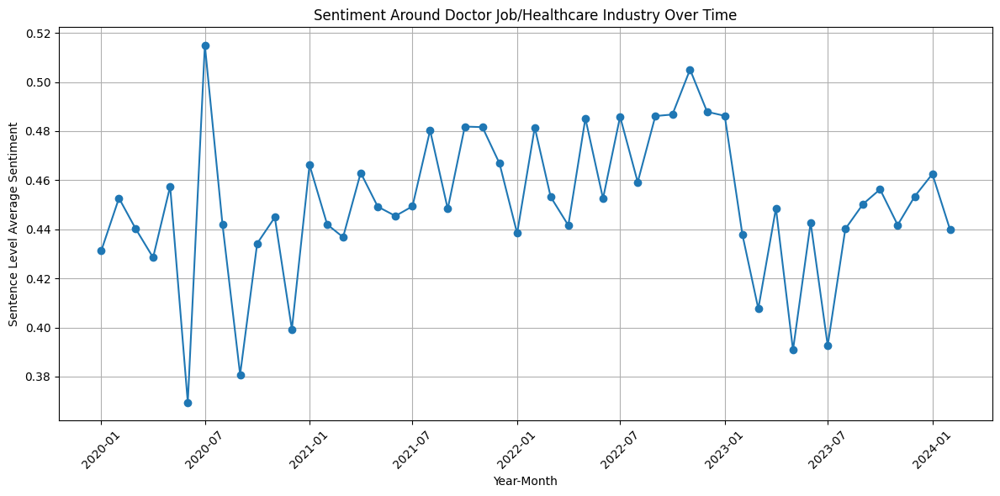

In [ ]:
doctor_sentence_sentiments_df['date'] = pd.to_datetime(doctor_sentence_sentiments_df['date'])

doctor_sentence_sentiments_df['year'] = pd.to_datetime(doctor_sentence_sentiments_df['date']).dt.year
doctor_sentence_sentiments_df['month'] = pd.to_datetime(doctor_sentence_sentiments_df['date']).dt.month

# Create a combined year-month column for easier grouping
doctor_sentence_sentiments_df['year_month'] = doctor_sentence_sentiments_df['date'].dt.to_period('M')

# Calculate the average sentiment per article
doctor_sentence_sentiments_df['average_sentiment'] = doctor_sentence_sentiments_df['doctor_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)

# Aggregate by year and month
year_month_sentiment = doctor_sentence_sentiments_df.groupby('year_month')['average_sentiment'].mean().reset_index()

# Convert 'year_month' back to datetime for plotting (necessary because matplotlib does not handle Period objects well)
year_month_sentiment['year_month'] = year_month_sentiment['year_month'].dt.to_timestamp()

plt.figure(figsize=(12, 6))
plt.plot(year_month_sentiment['year_month'], year_month_sentiment['average_sentiment'], marker='o', linestyle='-')
plt.title('Sentiment Around Doctor Job/Healthcare Industry Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Sentence Level Average Sentiment')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


##### Educator

In [ ]:
educator = ['tutors', 'educators', 'teachers','tutor', 'educator', 'teacher', 'students', 'student', 'education', 'school', 'schools' ]

In [ ]:
data_for_new_df = {
    'date': df['date'],  # Preserving the original article's date
    'educator_sentences': batch_filter_sentences(df['text'].tolist(), educator)
}

educator_sentence_df = pd.DataFrame(data_for_new_df)

In [ ]:
# Apply cleaning to each list of sentences in the dataframe
educator_sentence_df['cleaned_educator_sentences'] = educator_sentence_df['educator_sentences'].apply(clean_sentence_for_sentiment)

In [ ]:
educator_sentence_df = educator_sentence_df[educator_sentence_df['cleaned_educator_sentences'].apply(lambda x: len(x) > 0)]
educator_sentence_df['educator_sentence_sentiment_probs'] = educator_sentence_df['cleaned_educator_sentences'].apply(analyze_sentence_sentiments)


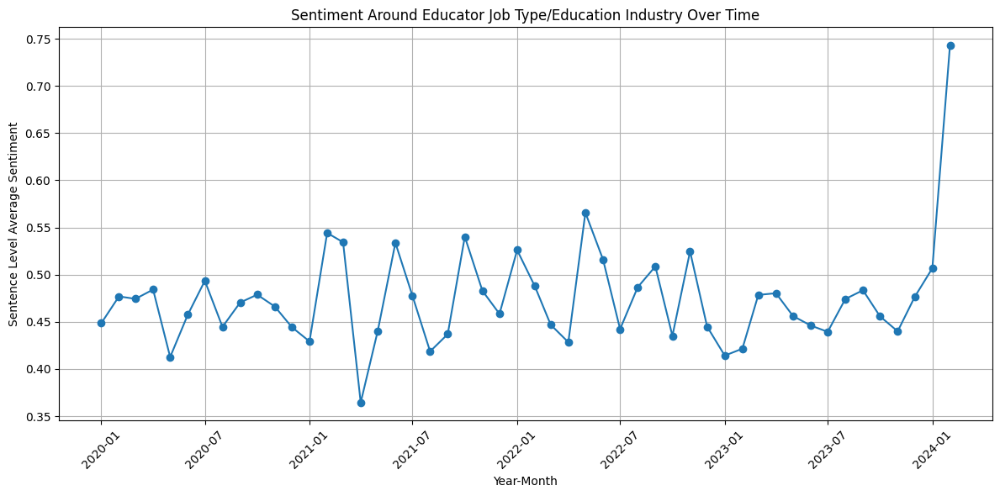

In [ ]:
educator_sentence_df['date'] = pd.to_datetime(educator_sentence_df['date'])

educator_sentence_df['year'] = pd.to_datetime(educator_sentence_df['date']).dt.year
educator_sentence_df['month'] = pd.to_datetime(educator_sentence_df['date']).dt.month

# Create a combined year-month column for easier grouping
educator_sentence_df['year_month'] = educator_sentence_df['date'].dt.to_period('M')

# Calculate the average sentiment per article
educator_sentence_df['average_sentiment'] = educator_sentence_df['educator_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)

# Aggregate by year and month
year_month_sentiment = educator_sentence_df.groupby('year_month')['average_sentiment'].mean().reset_index()

# Convert 'year_month' back to datetime for plotting (necessary because matplotlib does not handle Period objects well)
year_month_sentiment['year_month'] = year_month_sentiment['year_month'].dt.to_timestamp()

plt.figure(figsize=(12, 6))
plt.plot(year_month_sentiment['year_month'], year_month_sentiment['average_sentiment'], marker='o', linestyle='-')
plt.title('Sentiment Around Educator Job Type/Education Industry Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Sentence Level Average Sentiment')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

##### Technician

In [ ]:
tech = ['tech professionals', 'tech professional','technicians', 'technician', 'technology industry', 'tech people', 'tech industry']

In [ ]:
data_for_new_df = {
    'date': df['date'],  # Preserving the original article's date
    'tech_sentences': batch_filter_sentences(df['text'].tolist(), tech)
}

tech_sentence_df = pd.DataFrame(data_for_new_df)
tech_sentence_df = tech_sentence_df[tech_sentence_df['tech_sentences'].apply(lambda x: len(x) > 0)]

In [ ]:
# Apply cleaning to each list of sentences in the dataframe
tech_sentence_df['cleaned_tech_sentences'] = tech_sentence_df['tech_sentences'].apply(clean_sentence_for_sentiment)

In [ ]:
tech_sentence_df['tech_sentence_sentiment_probs'] = tech_sentence_df['cleaned_tech_sentences'].apply(analyze_sentence_sentiments)


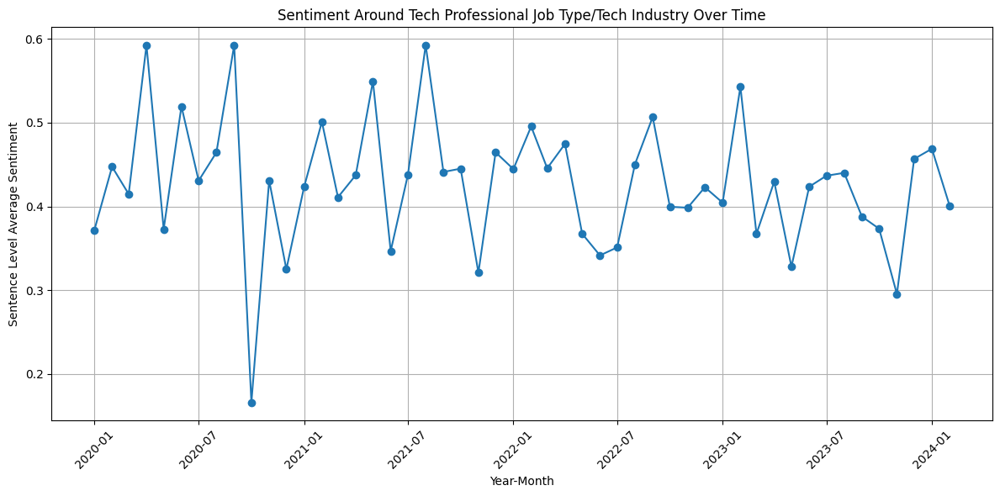

In [ ]:
tech_sentence_df['date'] = pd.to_datetime(tech_sentence_df['date'])

tech_sentence_df['year'] = pd.to_datetime(tech_sentence_df['date']).dt.year
tech_sentence_df['month'] = pd.to_datetime(tech_sentence_df['date']).dt.month

# Create a combined year-month column for easier grouping
tech_sentence_df['year_month'] = tech_sentence_df['date'].dt.to_period('M')

# Calculate the average sentiment per article
tech_sentence_df['average_sentiment'] = tech_sentence_df['tech_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)

# Aggregate by year and month
year_month_sentiment = tech_sentence_df.groupby('year_month')['average_sentiment'].mean().reset_index()

# Convert 'year_month' back to datetime for plotting (necessary because matplotlib does not handle Period objects well)
year_month_sentiment['year_month'] = year_month_sentiment['year_month'].dt.to_timestamp()

plt.figure(figsize=(12, 6))
plt.plot(year_month_sentiment['year_month'], year_month_sentiment['average_sentiment'], marker='o', linestyle='-')
plt.title('Sentiment Around Tech Professional Job Type/Tech Industry Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Sentence Level Average Sentiment')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

##### Artist

In [ ]:
art = ['artists', 'artist', 'musicians', 'musician', 'art']

In [ ]:
data_for_new_df = {
    'date': df['date'],  # Preserving the original article's date
    'art_sentences': batch_filter_sentences(df['text'].tolist(), art)
}

artist_sentence_df = pd.DataFrame(data_for_new_df)

In [ ]:
artist_sentence_df = artist_sentence_df[artist_sentence_df['art_sentences'].apply(lambda x: len(x) > 0)]

In [ ]:
artist_sentence_df['cleaned_art_sentences'] = artist_sentence_df['art_sentences'].apply(clean_sentence_for_sentiment)

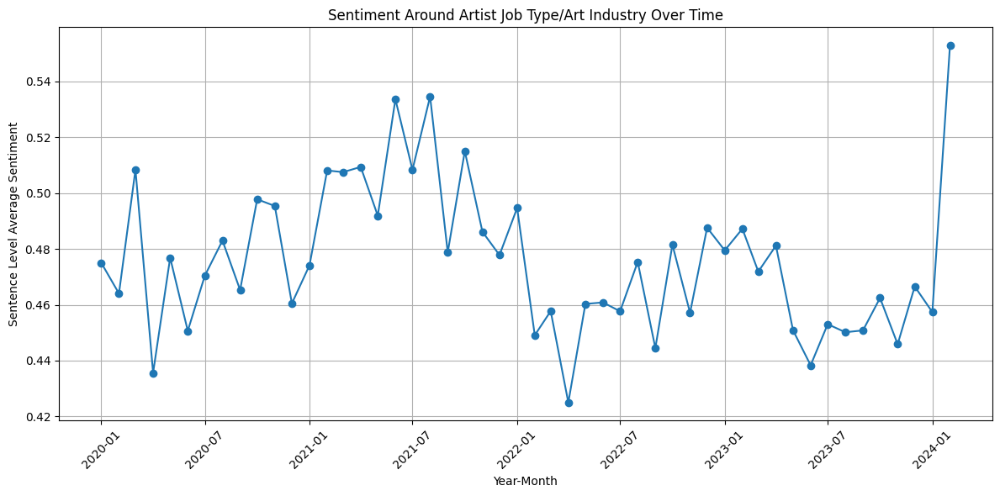

In [ ]:
artist_sentence_df['date'] = pd.to_datetime(artist_sentence_df['date'])

artist_sentence_df['year'] = pd.to_datetime(artist_sentence_df['date']).dt.year
artist_sentence_df['month'] = pd.to_datetime(artist_sentence_df['date']).dt.month

# Create a combined year-month column for easier grouping
artist_sentence_df['year_month'] = artist_sentence_df['date'].dt.to_period('M')

# Calculate the average sentiment per article
artist_sentence_df['average_sentiment'] = artist_sentence_df['art_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)

# Aggregate by year and month
year_month_sentiment = artist_sentence_df.groupby('year_month')['average_sentiment'].mean().reset_index()

# Convert 'year_month' back to datetime for plotting (necessary because matplotlib does not handle Period objects well)
year_month_sentiment['year_month'] = year_month_sentiment['year_month'].dt.to_timestamp()

plt.figure(figsize=(12, 6))
plt.plot(year_month_sentiment['year_month'], year_month_sentiment['average_sentiment'], marker='o', linestyle='-')
plt.title('Sentiment Around Artist Job Type/Art Industry Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Sentence Level Average Sentiment')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

## 3. Name Entity Recognition(Technology Extraction)

### 3.1 Functions Used

In [ ]:
stop_words = set(nltk.corpus.stopwords.words('english'))
def minimal_cleaning_for_ner(text, max_length=15):
    """
    This function applies minimum cleaning steps to the input text to
    help conduct accurate Name Entity Recognition task downstream.
    """
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'(?:\@|http?\://|https?\://|www)\S+', '', text)
    text = re.sub(r'[\n\t]+', ' ', text)
    text = re.sub(r'<[^>]+>', '', text)
    tokens = nltk.tokenize.word_tokenize(text)
    return ' '.join([token for token in tokens
        if token.lower() not in stop_words
        and len(token) <= max_length])

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
nlp = spacy.load("en_core_web_sm")
def extract_technologies_without_seg_spacy(text):
    """
    This function extracts entities with labels 'ORG', 'PRODUCT', 'PERSON', and 'GPE'
    to try to identify technology terms from the input text without splitting the sentences first.
    """
    doc = nlp(text)
    return [ent.text for ent in doc.ents if ent.label_ in ('ORG', 'PRODUCT', 'PERSON', 'GPE')]

### 3.2 Prepare Data & Apply NER

In [ ]:
df['clean_ner_text'] = df['text'].apply(minimal_cleaning_for_ner)

In [ ]:
df['technologies_entities'] = df['clean_ner_text'].apply(extract_technologies_without_seg_spacy)

In [ ]:
df.rename(columns={'technologies_entities': 'NER entities'}, inplace=True)
df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,url,date,language,title,text,cleaned_text,clean_ner_text,NER entities
0,http://galusaustralis.com/2020/02/486473/legal...,2020-02-26,en,LegalTech Artificial Intelligence Market 2019 ...,LegalTech Artificial Intelligence Market 2019 ...,legaltech artificial intelligence market techn...,LegalTech Artificial Intelligence Market Techn...,[LegalTech Artificial Intelligence Market Tech...
1,http://newsparliament.com/2020/02/27/children-...,2020-02-27,en,Children With Autism Saw Their Learning and So...,\nChildren With Autism Saw Their Learning and ...,child autism saw learning social skill boosted...,Children Autism Saw Learning Social Skills Boo...,"[U.S., Italy, Dettol, Levi Strauss, Comments A..."
2,http://www.agoravox.it/Covid-19-un-messaggio-d...,2020-03-13,en,Covid-19: un messaggio dai ricercatori italian...,\n\n\nCovid-19: un messaggio dai ricercatori i...,messaggio dai ricercatori italiani colleghi st...,Covid- : un messaggio dai ricercatori italiani...,"[un, dai, italiani, Accedi Partecipa, AgoraVox..."
3,http://www.millenniumpost.in/big-stories/ai-ex...,2020-08-07,en,Two dead as AI Express flight skids off Kozhik...,Two dead as AI Express flight skids off Kozhik...,two dead express flight skid kozhikode postbey...,Two dead AI Express flight skids Kozhikode Pos...,"[AI Express, Kozhikode PostBeyond, AI Express,..."
4,http://www.nativestew.com/2023/11/ai-took-my-j...,2023-11-20,en,"Native Stew - Bahamas AI Art, Photos, Videos: ...","\nNative Stew - Bahamas AI Art, Photos, Videos...",native stew bahamas art photo video took job p...,"Native Stew - Bahamas AI Art , Photos , Videos...","[Native Stew - Bahamas AI Art, Videos, AI Took..."


### 3.3 Aggregate Entities by Counts to Identify Most Commonly Mentioned Technology Entities from Articles

In [ ]:
# Flatten the list of lists to count entities across all articles
all_tech_entities = [entity for sublist in df['NER entities'] for entity in sublist]
tech_entity_counts = Counter(all_tech_entities)


In [ ]:
# Convert the Counter object to a DataFrame
ner_entity_df = pd.DataFrame(tech_entity_counts.items(), columns=['Entity', 'Count'])

# Sort the DataFrame by count in descending order for better readability
ner_entity_df = ner_entity_df.sort_values(by='Count', ascending=False).reset_index(drop=True)


In [ ]:
ner_entity_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Entity,Count
0,AI,1259725
1,US,222110
2,Gray Media Group,130692
3,OpenAI,120768
4,Microsoft,116544


In [ ]:
# Most common technology entities
pd.set_option('display.max_rows', None)
ner_entity_df.head(500)

,Entity,Count
0,AI,1259725
1,US,222110
2,Gray Media Group,130692
3,OpenAI,120768
4,Microsoft,116544
5,Google,106582
6,India,78376
7,China,71565
8,U.S.,65443
9,Us,55386


#### **Observations:**

**High frequency companies: PRNewswire, Nvidia, Digi Communications, NPR, Alphabet, Qatar, AMD, Bloomberg, SAP, Oracle**

**High frequency people names: Sam Altman, Elon Musk**

**High frequency technology terms: Generative AI, CNN, Google Cloud, NLP, Machine Learning, Alexa, AI/ML**

### 3.4 Plot Timelines to Illustrate the Introduction of These Technologies

#### GPT

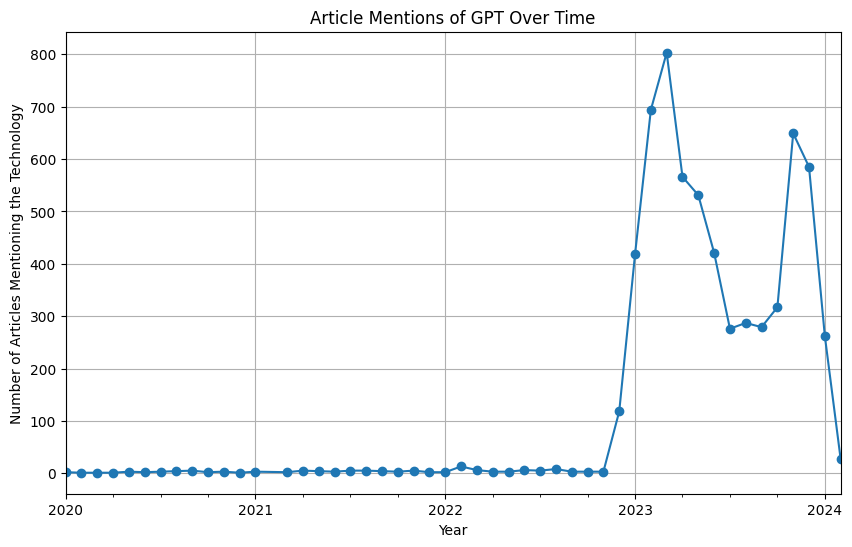

In [ ]:
df['date'] = pd.to_datetime(df['date'])
df['year'] = pd.to_datetime(df['date']).dt.year
df['month'] = pd.to_datetime(df['date']).dt.month
df['year_month'] = df['date'].dt.to_period('M')

technology_to_track = 'GPT'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()


#### OpenAI

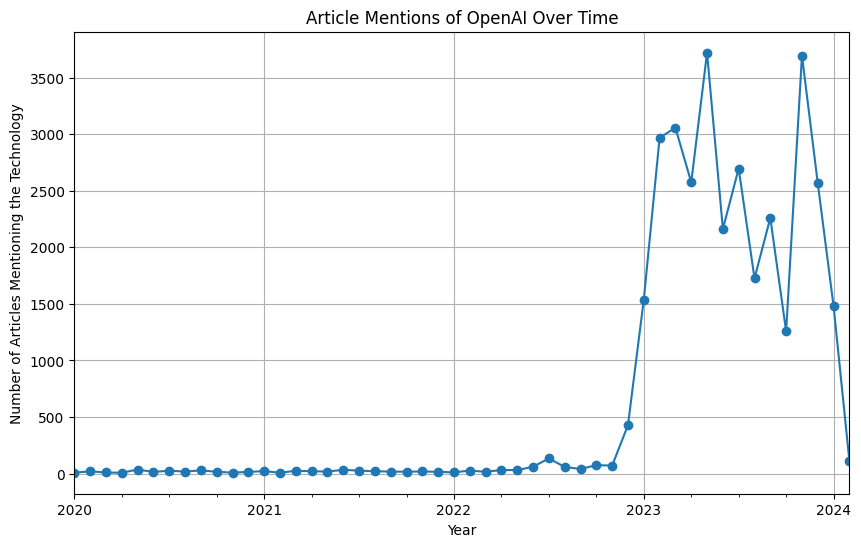

In [ ]:
df['date'] = pd.to_datetime(df['date'])
df['year'] = pd.to_datetime(df['date']).dt.year
df['month'] = pd.to_datetime(df['date']).dt.month
df['year_month'] = df['date'].dt.to_period('M')

technology_to_track = 'OpenAI'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()


#### Generative AI

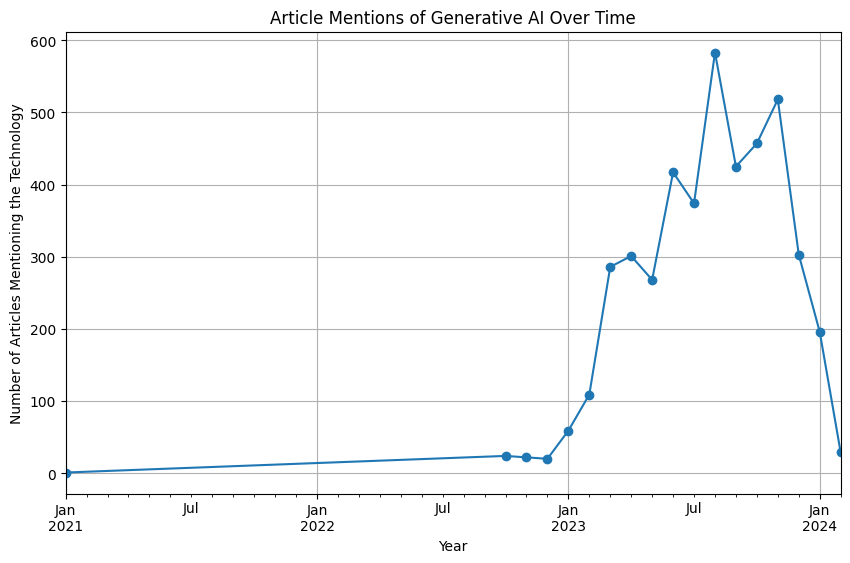

In [ ]:
technology_to_track = 'Generative AI'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()

#### CNN

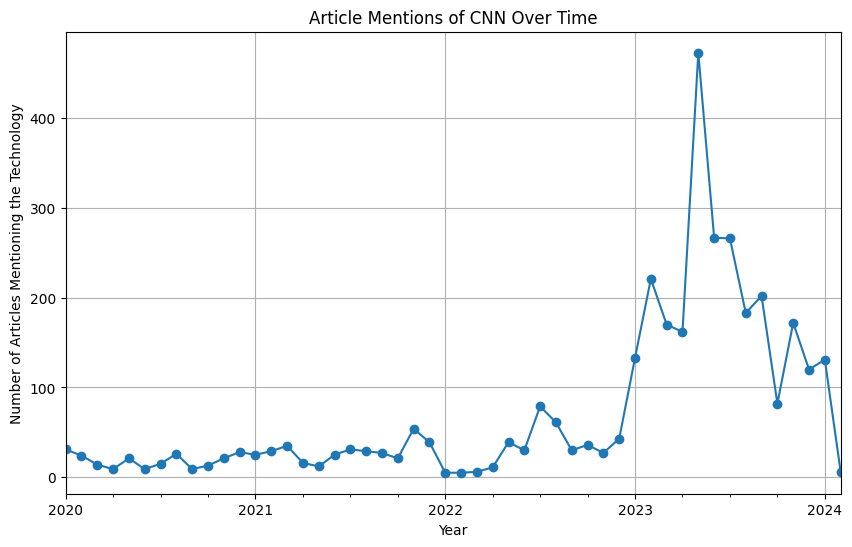

In [ ]:
technology_to_track = 'CNN'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()

#### Google Cloud

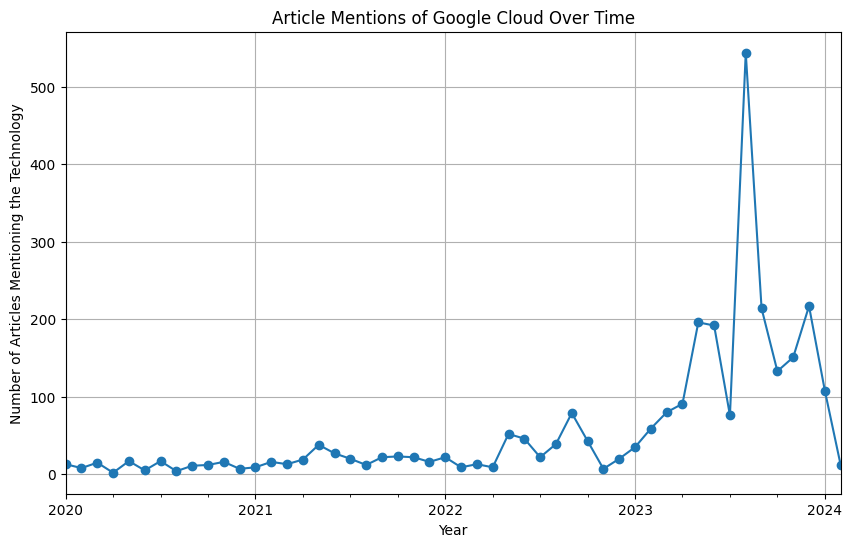

In [ ]:
technology_to_track = 'Google Cloud'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()

#### NLP

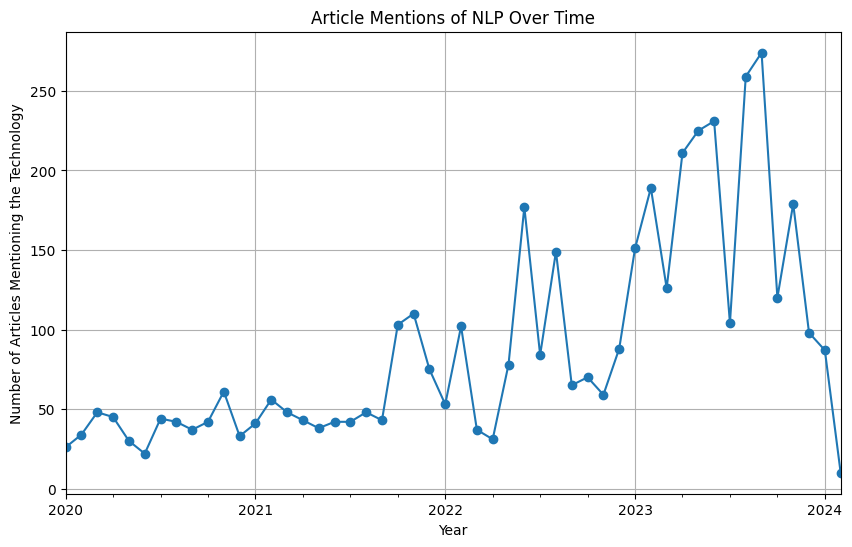

In [ ]:
technology_to_track = 'NLP'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()

#### Machine Learning

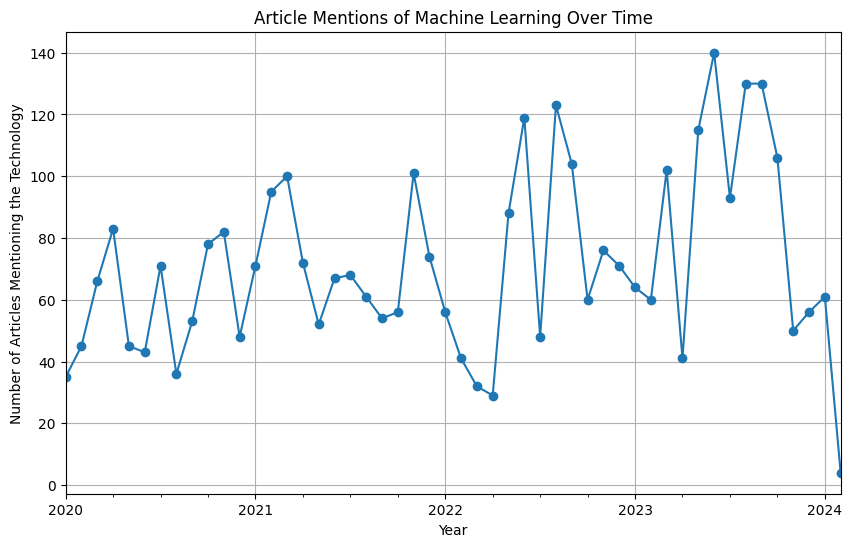

In [ ]:
technology_to_track = 'Machine Learning'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()

#### Alexa

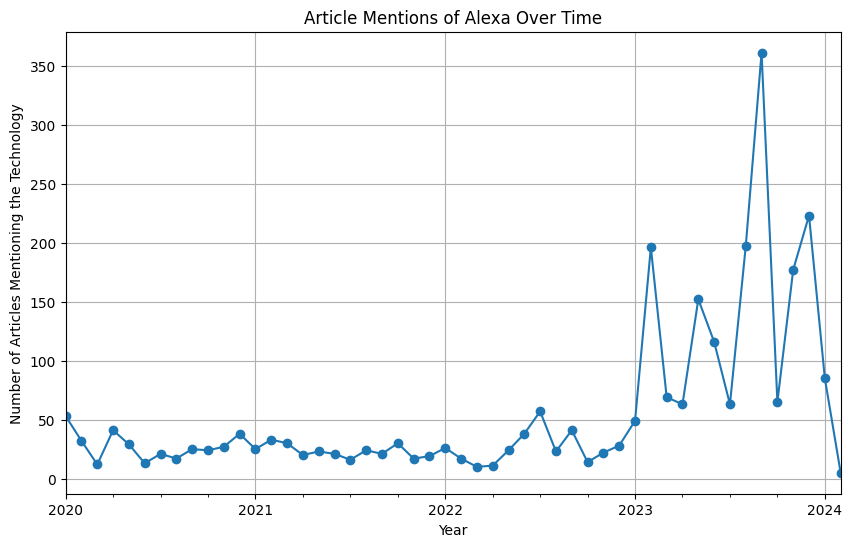

In [ ]:
technology_to_track = 'Alexa'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()

#### AI/ML

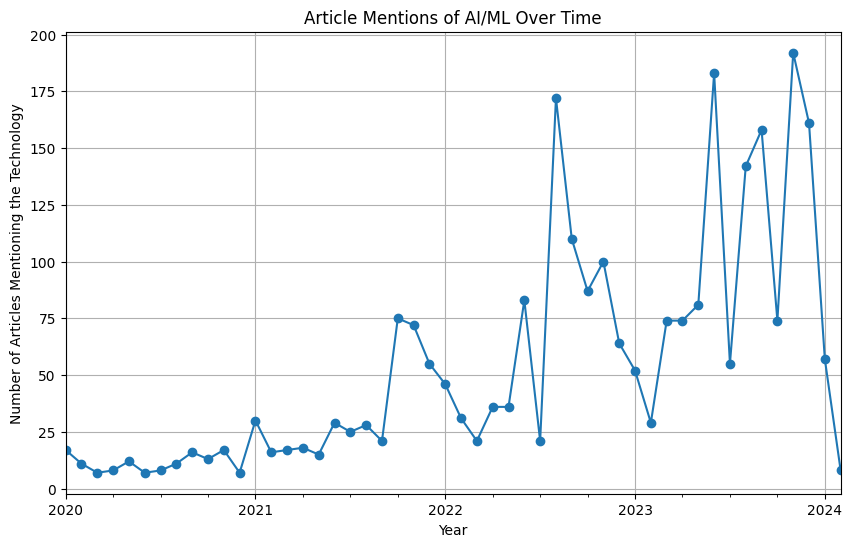

In [ ]:
technology_to_track = 'AI/ML'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()

#### Bing

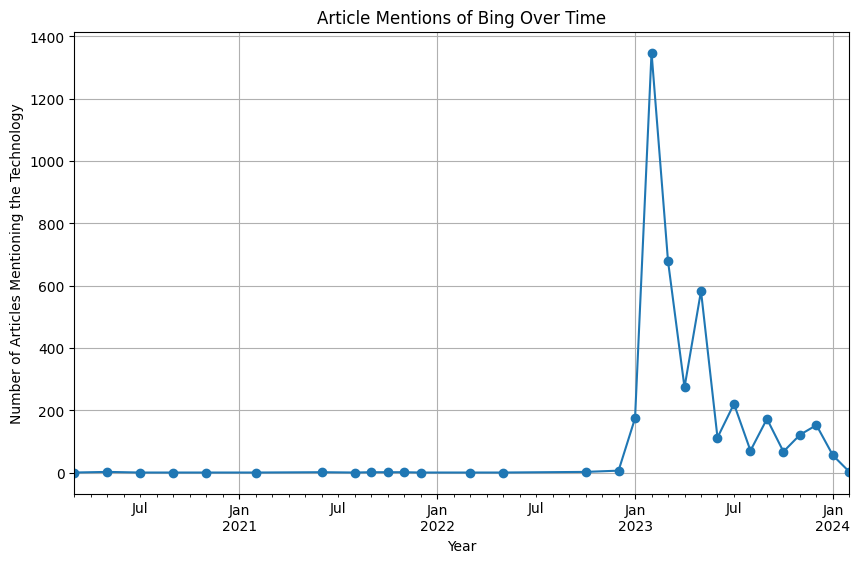

In [ ]:
technology_to_track = 'Bing'

# Filter dataframe for articles mentioning the technology and aggregate by year
mentions_over_time = df[df['NER entities'].apply(lambda x: technology_to_track in x)].groupby('year_month').size()

plt.figure(figsize=(10, 6))
mentions_over_time.plot(kind='line', marker='o')
plt.title(f'Article Mentions of {technology_to_track} Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Articles Mentioning the Technology')
plt.grid(True)
plt.show()

## 4. Targeted Sentiment Identification(of Companies and People) to Identify Companies Likely to invest in AI Technology & Applications Cannot Be Transformed By AI Currently

### 4.1 Categorize Companies Identified Earily from NER Based on Industry

In [ ]:
tech_cons_electronics= ['Microsoft', 'Apple', 'Samsung', 'Intel', 'Nvidia', 'AMD', 'Oracle', 'Android']
social_media_onli_service = ['Google', 'Facebook', 'Instagram','Twitter', 'LinkedIn', 'TikTok', 'YouTube' ]
e_commercne_techAI = ['Amazon', 'IBM', 'Meta', 'SAP']
media_entertainment = ['Netflix', 'NPR', 'Gray Media Group']
automotive =['Tesla']
search_engi_web_serv=['Baidu', 'Alphabet']

### 4.2 Analyze Sentiments around these Companies & Visualize with Word Cloud

#### Automotive Companies

In [ ]:
data_for_new_df = {
    'tech_sentences': batch_filter_sentences(df['text'].tolist(), automotive)
}

automotive_sentence_senti_df = pd.DataFrame(data_for_new_df)
# print(len(automotive_sentence_senti_df))

In [ ]:
automotive_sentence_senti_df = automotive_sentence_senti_df[automotive_sentence_senti_df['tech_sentences'].apply(lambda x: len(x) > 0)]

In [ ]:
automotive_sentence_senti_df['cleaned_automotive_sentences'] = automotive_sentence_senti_df['tech_sentences'].apply(clean_sentence_for_sentiment)

In [ ]:
automotive_sentence_senti_df['auto_sentence_sentiment_probs'] = automotive_sentence_senti_df['cleaned_automotive_sentences'].apply(analyze_sentence_sentiments)

In [ ]:
automotive_sentence_senti_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


tech_sentences  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    [Shares of rate-sensitive growth companies such as Meta Platforms Inc, Te

In [ ]:
automotive_sentence_senti_df['ave_article_sentiment'] = automotive_sentence_senti_df['auto_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)
automotive_sentence_senti_df = automotive_sentence_senti_df.sort_values(by='ave_article_sentiment', ascending=False)

In [ ]:
automotive_sentence_senti_df.head()

,tech_sentences,cleaned_automotive_sentences,auto_sentence_sentiment_probs,ave_article_sentiment
1133,[Flair Writing IPO Black Friday Nifty 50 Amazo...,[Flair Writing IPO Black Friday Nifty Amazon S...,[0.9768705543510567],0.976871
708,[Launched in Email Writing Artificial Intellig...,[Launched Email Writing Artificial Intelligenc...,[0.9387331741509414],0.938733
418,[Super graphics card might be another flopBy D...,[Super graphics card might another flopBy Darr...,[0.9383474710271277],0.938347
985,[Comments \n Inline Feedbac...,[Comments Inline Feedbacks View all comments S...,[0.9277010670401278],0.927701
287,[Microsoft experiences data center outage and ...,[Microsoft experiences data center outage and ...,[0.9269190267184292],0.926919


In [ ]:
automotive_sentence_senti_df.tail()

,tech_sentences,cleaned_automotive_sentences,auto_sentence_sentiment_probs,ave_article_sentiment
579,[With Tesla CEO Elon Musk as its co-chair and ...,[With Tesla CEO Elon Musk its chair and among ...,[0.06634080749028992],0.066341
660,[With Tesla CEO Elon Musk as its co-chair and ...,[With Tesla CEO Elon Musk its chair and among ...,[0.06634080749028992],0.066341
581,[It should be noted that the company is no lon...,[should noted that the company longer non prof...,[0.05641806126782073],0.056418
730,[TechnologyTechnology · 5:41 PM UTCU.S. agenci...,[UTCU.S. agencies probe fatal Tesla crash beli...,[0.05112648517272262],0.051126
1058,[Get it insured\n\n \n\nMillennial Money: Try ...,[Get insured Millennial Money Try touchless pa...,[0.013793220133651132],0.013793


In [ ]:
# Calculate the overall average sentiment from the 'average_article_sentiment' column
overall_average_sentiment = automotive_sentence_senti_df['ave_article_sentiment'].mean()
print("Overall Average Sentiment Around Automotive Companies:", overall_average_sentiment)

Overall Average Sentiment Around Automotive Companies: 0.4428365226462475


In [ ]:
percentage_greater_than_05 = (len(automotive_sentence_senti_df[automotive_sentence_senti_df['ave_article_sentiment'] > 0.5]) / len(automotive_sentence_senti_df)) * 100
print(f"Percentage of Positive Sentiment Around Automotive Companies: {percentage_greater_than_05:.2f}%")

Percentage of Positive Sentiment Around Automotive Companies: 33.04%


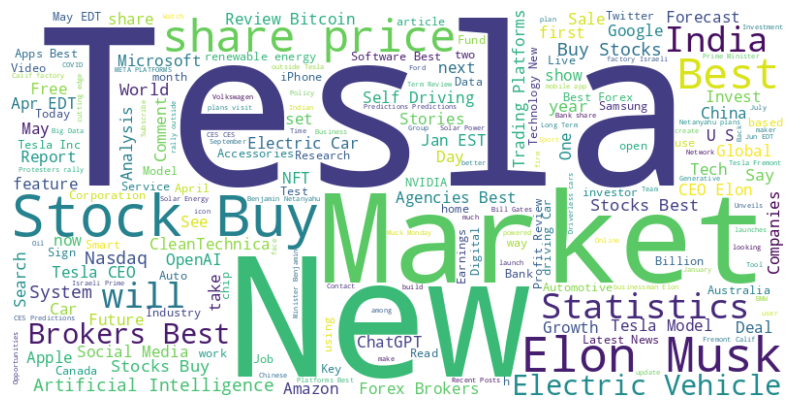

In [ ]:
filtered_df = automotive_sentence_senti_df[automotive_sentence_senti_df['ave_article_sentiment'] > 0.5]

# Aggregate sentences from 'cleaned_automotive_sentences' column
all_sentences = []
for sentence_list in filtered_df['cleaned_automotive_sentences']:
    all_sentences.extend(sentence_list)

# Join sentences into a single string
text = ' '.join(all_sentences)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
pos_exampke = automotive_sentence_senti_df[automotive_sentence_senti_df['ave_article_sentiment'] > 0.5]

In [ ]:
pos_exampke['cleaned_automotive_sentences'].iloc[30]

array(['Tesla and Twitter CEO Elon Musk reportedly assembling team artificial intelligence experts build alternative ChatGPT and other similar ideas may also development'],
      dtype=object)

#### Social Media & Online Service Companies

In [ ]:
data_for_new_df = {
    'smos_sentences': batch_filter_sentences(df['text'].tolist(), social_media_onli_service)
}

sm_sentence_senti_df = pd.DataFrame(data_for_new_df)

In [ ]:
sm_sentence_senti_df = sm_sentence_senti_df[sm_sentence_senti_df['smos_sentences'].apply(lambda x: len(x) > 0)]
sm_sentence_senti_df['cleaned_smos_sentences'] = sm_sentence_senti_df['smos_sentences'].apply(clean_sentence_for_sentiment)
sm_sentence_senti_df['smos_sentence_sentiment_probs'] = sm_sentence_senti_df['cleaned_smos_sentences'].apply(analyze_sentence_sentiments)

In [ ]:
sm_sentence_senti_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,smos_sentences,cleaned_smos_sentences,smos_sentence_sentiment_probs
0,"[MonopolyLast week, eccentric actor, comedian and spiritual journeyman, Russell Brand took to the airwaves to address his nearly 6 million youtube subscribers.]",[MonopolyLast week eccentric actor comedian and spiritual journeyman Russell Brand took the airwaves address his nearly million youtube subscribers],[0.36399435993609147]
1,"[To stay updated with NeoSwap's latest activities, follow NeoSwap on Twitter.\n]",[stay updated with NeoSwap latest activities follow NeoSwap Twitter],[0.3104529006117668]
2,"[The latest AI models from Google and Meta (Facebook) are trained on about one trillion words., Connect via Twitter, Facebook or email., HeraldTwitterFacebookInstagramRSSOur SitesThe Sydney Morning HeraldThe AgeBrisbane TimesWAtodayThe Australian Financial ReviewDomainDriveClassifiedsTributesCelebrationsPlace your adCommercial Real EstateThe Sydney Morning HeraldContact & supportAdvertise with usNewslettersAccessibility guideSitemapPhoto salesPurchase front pagesContent licensingWork with usTerms of usePrivacy policyPress CouncilCharter of Editorial IndependenceProducts & ServicesSubscription packagesMy accountSubscriber FAQsDelivery]","[The latest models from Google and Meta Facebook are trained about one trillion words, Connect via Twitter Facebook email, SitesThe Sydney Morning HeraldThe AgeBrisbane TimesWAtodayThe Australian Financial your adCommercial Real EstateThe Sydney Morning HeraldContact supportAdvertise with guideSitemapPhoto salesPurchase front pagesContent licensingWork with usTerms usePrivacy policyPress CouncilCharter Editorial packagesMy accountSubscriber FAQsDelivery]","[0.42895067145481597, 0.2820830833182923, 0.5444569652287979]"
3,[Twitter\n \n\n],[Twitter],[0.4829148565509881]
4,"[Once again, the company showed noticeable progress in both its advertising unit and cloud segment as competition from TikTok, Meta Platforms, Microsoft, and Amazon lingers., The table illustrates the revenue profile of each of these segments for the quarter ended Sept. 30.\n\n\nItem\nQ3 2023\nQ3 2022\n% Change\n\n\nGoogle Search and other\n$44,026\n$39,539\n11%\n\n\nYouTube ads\n$7,952\n$7,071\n12%\n\n\nGoogle Network\n$7,669\n$7,872\n(3%)\n\n\nGoogle advertising\n$59,647\n$54,482\n9%\n\n\nGoogle other\n$8,339\n$6,895\n21%\n\n\nGoogle Services total\n$67,986\n$61,377\n11%\n\n\nGoogle Cloud\n$8,411\n$6,868\n22%\n\n\nData source: Q3 earnings release., On the advertising front, Alphabet increased revenue by 9%, which was primarily fueled by Google Search and YouTube., The model, dubbed Google Bard, was built to be ""a complementary experience to Google Search."", The tool can now be used among many Google apps, including Workspace, YouTube, and Maps., The company shared that over half of start-ups focusing on generative AI and that have raised outside capital are customers of Google Cloud., One of the core pillars of Google Cloud is a multifaceted product called Duet AI., Customers such as PayPal are using Duet AI to increase software development, while others are taking advantage of the tool's data analysis function within Google Workspace apps.\n\n, Randi Zuckerberg, a former director of market development and spokeswoman for Facebook and sister to Meta Platforms CEO Mark Zuckerberg, is a member of The Motley Fool's board of directors.]","[Once again the company showed noticeable progress both its advertising unit and cloud segment competition from TikTok Meta Platforms Microsoft and Amazon lingers, The table illustrates the revenue profile each these segments for the quarter ended Sept. Item Change Google Search and other YouTube ads Google Network Google advertising Google other Google Services total Google Cloud Data source earnings release, the advertising front Alphabet increased revenue which was primarily fueled Google Search and YouTube, The model dubbed Google Bard was built complementary experience Google Search, The tool can now used among many G

In [ ]:
sm_sentence_senti_df['ave_article_sentiment'] = sm_sentence_senti_df['smos_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)
sm_sentence_senti_df = sm_sentence_senti_df.sort_values(by='ave_article_sentiment', ascending=False)

In [ ]:
overall_average_sentiment = sm_sentence_senti_df['ave_article_sentiment'].mean()

print("Overall Average Sentiment Around Social Media & Online Service Companies:", overall_average_sentiment)

Overall Average Sentiment Around Social Media & Online Service Companies: 0.4432031884091865


In [ ]:
percentage_greater_than_05 = (len(sm_sentence_senti_df[sm_sentence_senti_df['ave_article_sentiment'] > 0.5]) / len(sm_sentence_senti_df)) * 100

print(f"Percentage of Positive Sentiment Around Social Media & Online Service Companies: {percentage_greater_than_05:.2f}%")

Percentage of Positive Sentiment Around Social Media & Online Service Companies: 28.00%


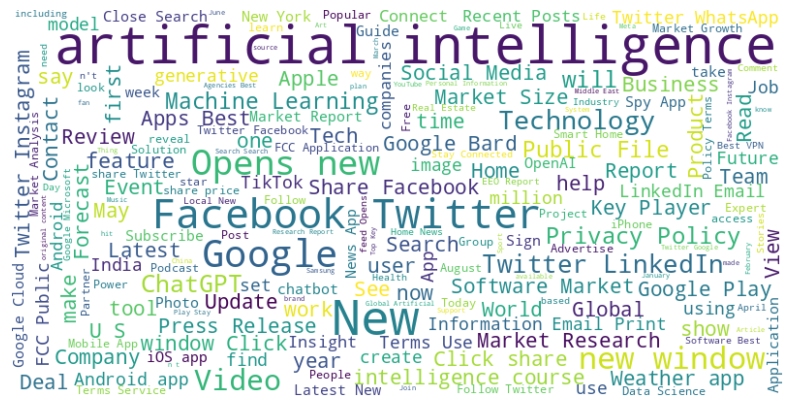

In [ ]:
filtered_df = sm_sentence_senti_df[sm_sentence_senti_df['ave_article_sentiment'] > 0.5]
all_sentences = []
for sentence_list in filtered_df['cleaned_smos_sentences']:
    all_sentences.extend(sentence_list)

text = ' '.join(all_sentences)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
pos_example = sm_sentence_senti_df[sm_sentence_senti_df['ave_article_sentiment'] > 0.5]

In [ ]:
pos_example['cleaned_smos_sentences'].iloc[29]

array(['International Google sees huge opportunities for future S.Korea Seoul July tech giant Google has seen great potential for artificial intelligence technologies South ... ...            ',
       'International Google sees huge opportunities for future S.Korea Seoul July tech giant Google has seen great potential for artificial intelligence technologies South ... ...            ',
       'International Google sees huge opportunities for future S.Korea Seoul July tech giant Google has seen great potential for artificial intelligence technologies South ... ...            '],
      dtype=object)

#### Technology Consumer Electronics Companies

In [ ]:
data_for_new_df = {
    'tce_sentences': batch_filter_sentences(df['text'].tolist(), tech_cons_electronics)
}

tce_sentence_senti_df = pd.DataFrame(data_for_new_df)

In [ ]:
tce_sentence_senti_df = tce_sentence_senti_df[tce_sentence_senti_df['tce_sentences'].apply(lambda x: len(x) > 0)]
tce_sentence_senti_df['cleaned_tce_sentences'] = tce_sentence_senti_df['tce_sentences'].apply(clean_sentence_for_sentiment)
tce_sentence_senti_df['tce_sentence_sentiment_probs'] = tce_sentence_senti_df['cleaned_tce_sentences'].apply(analyze_sentence_sentiments)

In [ ]:
tce_sentence_senti_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


tce_sentences  \
0  [Nvidia unveils new gaming chip with AI features, taps TSMC for manufacturing         HOME    MAIL    NEWS    FINANCE    SPORTS    ENTERTAINMENT    LIFE    SEARCH    SHOPPING    YAHOO PLUS    MORE...     , Close this content ReutersNvidia unveils new gaming chip with AI features, taps TSMC for manufacturingRead full articleFILE PHOTO:, The logo of Nvidia Corporation is seen during the annual Computex computer exhibition in TaipeiStephen NellisSeptember 20, 2022, 11:25 AM·2 min readBy Stephen Nellis(Reuters) - Nvidia Corp on Tuesday announced new flagship chips for video gamers that use artificial intelligence (AI) to enhance graphics, saying it has tapped Taiwan Semiconductor Manufacturing Co to make the processors., Nvidia has gained attention in recent years with its booming data center business, which sells chips used in artificial intelligence work such as natural language processing., In a streamed online keynote address, Nvidia Chief Executive Jensen Huang on Tuesday introduced the company's newest "Ada Lovelace" series of graphics chips, named for the 19th-century British mathematician regarded as an early pioneer in computer science., Nvidia designs its chips but has them manufactured by partners., Huang said the chips will be made by Taiwan Semiconductor Manufaturing (TSMC) with its "4N" chip manufacturing technology, a change from Nvidia's previous generation of flagship gaming chips, which were made by Samsung Electronics Co Ltd., Computing what each pixel on the screen should look like is hard, so Nvidia chips use AI to predict how some pixels should look without doing the entire set of computations., The Lovelace chips have extended that technique to generate entire frames of a game using AI.In a media briefing, Matt Wuebbling, vice president of global GeForce marketing at Nvidia, said the Lovelace chips will be available for sale globally and are not affected by a recently imposed U.S. ban on selling Nvidia's top data center AI chips to China., Wuebbling also said the chips will not contain a so-called hash-rate limiter, a technology Nvidia put in its previous generation of chips to limit their use in mining the cryptocurrency Ethereum, because of recent changes in how that currency is tracked.(Reporting by Stephen Nellis; editing by Jonathan Oatis)\nRecommended StoriesThe Hill50 DAYS:, The contours of the midterms were unthinkable just a few…1d agoTheStreet.comHere's How to Trade Nvidia, This is where Huang tends to introduce whatever is set to be Nvidia's latest and greatest.  , Shares of rate-sensitive growth companies such as Meta Platforms Inc, Tesla Inc, Microsoft Corp, Nvidia Corp, Alphabet Inc and Amazon.com Inc fell between 0.9% and 1.5% as Treasury yields climbed in anticipation of the rate hike.5h agoBloombergGoldman Sachs Strikes Credit Card Deal With T-Mobile After Apple and GM(Bloomberg) --, It’s well documented by now that the Microsoft Corp. founder likely saw food shortages coming years ago., He’s been b23h agoYahoo Finance VideoBeyond Meat COO arrested for biting man’s noseYahoo Finance Live’s Brad Smith and Julie Hyman discuss reports that Beyond Meat COO Doug Ramsey has been arrested for biting a man’s nose.1h agoTheStreet.comNvidia Stock Nears Major Support on the ChartNvidia has fallen more than 60% from its highs and hit new 52-week lows last week., Much WorseHuffPost·3 min readYahoo NewsFamily says fatal shooting case shows ‘stand your ground’ defense doesn’t work for Black menYahoo News·7 min readThe Daily BeastFurious Texas Sheriff Announces Criminal Investigation Into Martha’s Vineyard Migrant FlightsThe Daily Beast·3 min readThe New York TimesAfter Texas Sent Him to Washington, One Migrant Launches a New LifeThe New York Times·8 min readAssociated Press'Out of control' STD situation prompts call for changesAssociated Press·4 min read\nPOPULARHere's How to Trade Nvidia, Even Though It Has Tempered ExpectationsTheStreet.comWhat Should Nvidia Reveal At The GTC Conferen

In [ ]:
tce_sentence_senti_df['ave_article_sentiment'] = tce_sentence_senti_df['tce_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)
tce_sentence_senti_df = tce_sentence_senti_df.sort_values(by='ave_article_sentiment', ascending=False)

In [ ]:
overall_average_sentiment = tce_sentence_senti_df['ave_article_sentiment'].mean()

print("Overall Average Sentiment Around tech_cons_electronics Companies:", overall_average_sentiment)

Overall Average Sentiment Around tech_cons_electronics Companies: 0.45076274864589744


In [ ]:
percentage_greater_than_05 = (len(tce_sentence_senti_df[tce_sentence_senti_df['ave_article_sentiment'] > 0.5]) / len(tce_sentence_senti_df)) * 100

print(f"Percentage of Positive Sentiment Around tech_cons_electronics Companies: {percentage_greater_than_05:.2f}%")

Percentage of Positive Sentiment Around tech_cons_electronics Companies: 30.80%


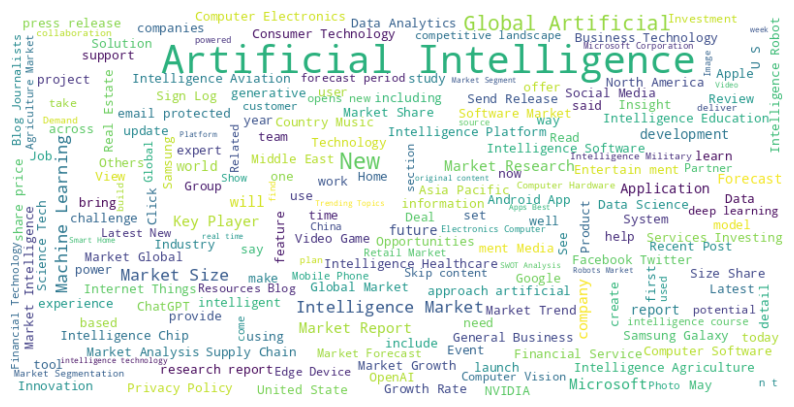

In [ ]:
filtered_df = tce_sentence_senti_df[tce_sentence_senti_df['ave_article_sentiment'] > 0.5]

all_sentences = []
for sentence_list in filtered_df['cleaned_tce_sentences']:
    all_sentences.extend(sentence_list)

text = ' '.join(all_sentences)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
pos_example = tce_sentence_senti_df[tce_sentence_senti_df['ave_article_sentiment'] > 0.5]

In [ ]:
pos_example['cleaned_tce_sentences'].iloc[46]

array(['Jet Cut Ready can reduce the work time required for video production .Launched Productivity SaaS Artificial Intelligence Jet Cut and create amazing ChatGPT appsSupport great',
       'Thank you!"The makers Jet Cut ReadyAbout this launchJet Cut ReadyAI plugin for Adobe ppro that automatically removes for updatesJet Cut Ready Jet Cut Ready was hunted レイワセダ株式会社 Productivity SaaS Artificial Intelligence'],
      dtype=object)

#### Sam Altman(Analyze Sentiments Around Popular AI Leaders & Visualize with Word Cloud)

In [ ]:
# Sam Altman
sa = ['Sam Altman']
data_for_new_df = {
    'sa_sentences': batch_filter_sentences(df['text'].tolist(), sa)
}
sa_sentence_senti_df = pd.DataFrame(data_for_new_df)

In [ ]:
sa_sentence_senti_df = sa_sentence_senti_df[sa_sentence_senti_df['sa_sentences'].apply(lambda x: len(x) > 0)]
sa_sentence_senti_df['cleaned_sa_sentences'] = sa_sentence_senti_df['sa_sentences'].apply(clean_sentence_for_sentiment)
sa_sentence_senti_df['sa_sentence_sentiment_probs'] = sa_sentence_senti_df['cleaned_sa_sentences'].apply(analyze_sentence_sentiments)

In [ ]:
sa_sentence_senti_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,sa_sentences,cleaned_sa_sentences,sa_sentence_sentiment_probs
0,"[The company behind ChatGPT fired one of its founders and CEO Sam Altman, leading to increased negative pressure for AI-based tokens like FET. \n, OpenAI controversy boosts FET’s rally\nData from Coingeco indicates that FET’s bullish momentum took a blow last week as news of Sam Altman leaving OpenAI broke. , Today, Microsoft announced Hiring Sam Altman to lead a new AI division. , What Sam Altman’s move to Microsoft means for the future of ChatGPT: 3 possible paths forward\n\n \n November 20, 2023 \n\nSearchSearch\n\nRecent Posts\nThe richest 1 percent emitted as much as the poorest two-thirds of humanity.\n, What Sam Altman’s move to Microsoft means for the future of ChatGPT: 3 possible paths forward\nThe Impact of Bariatric Surgery on Weight Loss and Glycemic Control in Patients With Obesity and Type 2 Diabetes: A Systematic Review\n, What Sam Altman’s move to Microsoft means for the future of ChatGPT: 3 possible paths forward\n\n \n November 20, 2023 \n\n \n]","[The company behind ChatGPT fired one its founders and CEO Sam Altman leading increased negative pressure for based tokens like FET, OpenAI controversy boosts FET rally Data from Coingeco indicates that FET bullish momentum took blow last week news Sam Altman leaving OpenAI broke, Today Microsoft announced Hiring Sam Altman lead new division, What Sam Altman move Microsoft means for the future ChatGPT possible paths forward November SearchSearch Recent Posts The richest percent emitted much the poorest two thirds humanity, What Sam Altman move Microsoft means for the future ChatGPT possible paths forward The Impact Bariatric Surgery Weight Loss and Glycemic Control Patients With Obesity and Type Diabetes Systematic Review, What Sam Altman move Microsoft means for the future ChatGPT possible paths forward November ]","[0.22492945513542473, 0.3062668402914213, 0.5353305889971308, 0.6016487763796684, 0.6264473273557386, 0.6723288439678179]"
1,"[OpenAI chief executive Sam Altman said the move was an ""opportunity to attract world-class talent"".\n]",[OpenAI chief executive Sam Altman said the move was opportunity attract world class talent],[0.5279836597700416]
2,[OpenAI's Sam Altman meanwhile believes that AI will soon enough be able to build humanity a completely new future.\n],[OpenAI Sam Altman meanwhile believes that will soon enough able build humanity completely new future],[0.8752725069084764]
3,"[They just parrot human thought – and lies\n\t\t\n\n\t\t\tSorry, Drake fans, the ability to reproduce his music is not a sign of intelligence\n\t\t\nKieren McCarthy\n\n\n\t\t18 May 2023 • 12:24pm\n\t\n\t\t\t\tSam Altman of OpenAI, creator of ChatGPT, faces a stern grilling from people who know nothing about the subject in Washington\n\t\t\t\n\nCredit: Eric Lee/Bloomberg\n\t\t\t\nAt a hot-ticket hearing in the US Congress this week, we got to hear from a man who six months ago was little known outside Silicon Valley. , Sam Altman has joined an echelon of American tech CEOs who are loved and feared in equal measure due to his position as the head of OpenAI, the creator of ChatGPT, a text-based online chat program that has led to an explosion of headlines and tech industry heartburn because it is able to produce better computer responses to human questions than anything before it.]","[They just parrot human thought and lies Sorry Drake fans the ability reproduce his music not sign intelligence Kieren McCarthy May Sam Altman OpenAI creator ChatGPT faces stern grilling from people who know nothing about the subject Washington Credit Eric Lee Bloomberg hot ticket hearing the Congress this week got hear from man who six months ago was little known outside Silicon Valley, Sam Altman has joined echelon American tech CEOs who are loved and feared equal measure due his position the head OpenAI the creator ChatGPT text based online chat program that has led explosion headlines and tech industry heartburn because able

In [ ]:
sa_sentence_senti_df['ave_article_sentiment'] = sa_sentence_senti_df['sa_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)
sa_sentence_senti_df = sa_sentence_senti_df.sort_values(by='ave_article_sentiment', ascending=False)
sa_sentence_senti_df.head()

,sa_sentences,cleaned_sa_sentences,sa_sentence_sentiment_probs,ave_article_sentiment
579,"[OpenAI CEO Sam Altman, in a wide-ranging interview with The Atlantic, ruminated on AI agents and how to approach their creation best. ]",[OpenAI CEO Sam Altman wide ranging interview with The Atlantic ruminated agents and how approach their creation best],[0.9220779679672078],0.922078
459,"[Dr. Sutskever co-founded OpenAI in 2015 alongside Elon Musk, Sam Altman, Greg Brockman, Wojciech Zaremba, and others.]",[Dr. Sutskever founded OpenAI alongside Elon Musk Sam Altman Greg Brockman Wojciech Zaremba and others],[0.8909587110095791],0.890959
348,"[OpenAI CEO Sam Altman is one of many concerned that governments aren't moving quickly enough to put fences around AIs in the name of the public good.\n\n\n, we definitely need more regulation on ai— Sam Altman (@sama) March 13, 2023\n]","[OpenAI CEO Sam Altman one many concerned that governments are n't moving quickly enough put fences around AIs the name the public good, definitely need more regulation Sam Altman March]","[0.8374046045096609, 0.9415103877539112]",0.889457
612,"[And Sam Altman, head of ChatGPT developer OpenAI, admitted he is “a little bit scared” that the technology could replace jobs too fast. \n\n]",[And Sam Altman head ChatGPT developer OpenAI admitted little bit scared that the technology could replace jobs too fast],[0.8780847952162315],0.878085
2,[OpenAI's Sam Altman meanwhile believes that AI will soon enough be able to build humanity a completely new future.\n],[OpenAI Sam Altman meanwhile believes that will soon enough able build humanity completely new future],[0.8752725069084764],0.875273


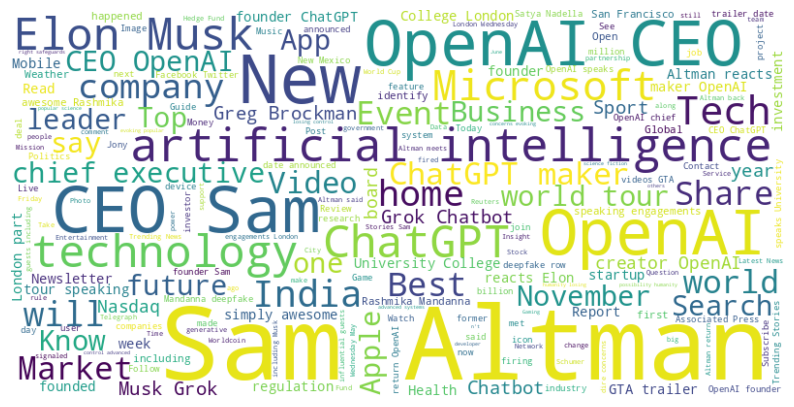

In [ ]:
filtered_df = sa_sentence_senti_df[sa_sentence_senti_df['ave_article_sentiment'] > 0.5]

all_sentences = []
for sentence_list in filtered_df['cleaned_sa_sentences']:
    all_sentences.extend(sentence_list)

text = ' '.join(all_sentences)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
pos_example = sa_sentence_senti_df[sa_sentence_senti_df['ave_article_sentiment'] > 0.5]

In [ ]:
pos_example['cleaned_sa_sentences'].iloc[65]

array(['Choose your planArrowRightIt was developed San Francisco based research laboratory OpenAI founded programmer and entrepreneur Sam Altman Elon Musk and other wealthy Silicon Valley investors develop technology that benefits all humanity'],
      dtype=object)

### 4.3 Analyze Sentiments Around Certain Fields/Applications to Understand AI Integration in the Niche

#### Banking/Financial Services

In [ ]:
bank = ['Bank', 'Banking', 'Financial', 'Financial Services']
data_for_new_df = {
    'article_text': df['text'],
    'bank_sentences': batch_filter_sentences(df['text'].tolist(), bank)
}
bank_sentence_senti_df = pd.DataFrame(data_for_new_df)

In [ ]:
bank_sentence_senti_df = bank_sentence_senti_df[bank_sentence_senti_df['bank_sentences'].apply(lambda x: len(x) > 0)]
bank_sentence_senti_df['cleaned_bank_sentences'] = bank_sentence_senti_df['bank_sentences'].apply(clean_sentence_for_sentiment)
bank_sentence_senti_df['bank_sentence_sentiment_probs'] = bank_sentence_senti_df['cleaned_bank_sentences'].apply(analyze_sentence_sentiments)

In [ ]:
bank_sentence_senti_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,article_text,bank_sentences,cleaned_bank_sentences,bank_sentence_sentiment_probs
0,Nvidia unveils new gaming chip with AI feature...,[T-Mobile US Inc.Most Read from BloombergHome-...,[Mobile Inc. Most Read from BloombergHome Flip...,"[0.5361327778634208, 0.2894028945309901, 0.537..."
1,\n\n \n\nNeoSwap AI Conducts World's First Sma...,[All Photos\nAll Videos\n\n\nMultimedia Galler...,[All Photos All Videos Multimedia Gallery Over...,"[0.5050676225539057, 0.3598328508434171]"
2,Artificial Intelligence raises competition con...,[NavigationMenuThe Sydney Morning HeraldSubscr...,[NavigationMenuThe Sydney Morning HeraldSubscr...,"[0.5195367140847565, 0.3468268077041769, 0.544..."
3,\n\nThe use of AI robot judges in Irish courts...,[What the men’s Euros next year can learn from...,[What the men Euros next year can learn from s...,[0.4189535241112022]
4,\nIs This Artificial Intelligence (AI) Stock-S...,[| Nasdaq\n\n \nSkip to main content\n\nNasdaq...,[Nasdaq Skip main content Nasdaq+ Weekly Macro...,"[0.6580648346477089, 0.5468300161411415, 0.444..."


In [ ]:
bank_sentence_senti_df['ave_article_sentiment'] = bank_sentence_senti_df['bank_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)
bank_sentence_senti_df = bank_sentence_senti_df.sort_values(by='ave_article_sentiment', ascending=False)
bank_sentence_senti_df.head()

,article_text,bank_sentences,cleaned_bank_sentences,bank_sentence_sentiment_probs,ave_article_sentiment
4570,"\nCome to the deepfake cabaret, where AI drag ...","[\nCome to the deepfake cabaret, where AI drag...",[Come the deepfake cabaret where drag performe...,[0.9994301439930776],0.999430
2850,\n\n\nSamsung's Galaxy AI Set to Transform Fol...,"[For more, see this post.\n Samsung's Galax...",[For more see this post Samsung Galaxy Ul...,"[0.9987479285962984, 0.9978340487673677]",0.998291
783,\nLogitech's Latest Headset Uses AI to Suppres...,[to Suppress Noise on Both Ends of a Call | PC...,[Suppress Noise Both Ends Call PCMag Menu Best...,[0.9975125760085181],0.997513
6496,\nAndroid Auto Will Summarize Your Noisy Text ...,[\nAndroid Auto Will Summarize Your Noisy Text...,[Android Auto Will Summarize Your Noisy Text T...,[0.9974925356695402],0.997493
1371,\nSamsung Gauss Joins Crowded Field of Generat...,[\nSamsung Gauss Joins Crowded Field of Genera...,[Samsung Gauss Joins Crowded Field Generative ...,[0.9974848741076368],0.997485


In [ ]:
overall_average_sentiment = bank_sentence_senti_df['ave_article_sentiment'].mean()

print("Overall Average Sentiment Around Banking Companies:", overall_average_sentiment)

Overall Average Sentiment Around Banking Companies: 0.4470399247079428


In [ ]:
percentage_less_than_05 = (len(bank_sentence_senti_df[bank_sentence_senti_df['ave_article_sentiment'] < 0.5]) / len(bank_sentence_senti_df)) * 100

print(f"Percentage of Negative Sentiment Around Banking Companies: {percentage_less_than_05:.2f}%")

Percentage of Negative Sentiment Around Banking Companies: 69.04%


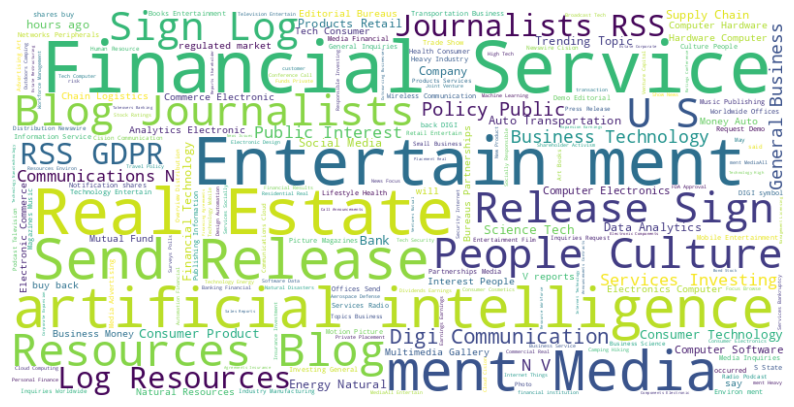

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
filtered_df = bank_sentence_senti_df[bank_sentence_senti_df['ave_article_sentiment'] < 0.5]

all_sentences = []
for sentence_list in filtered_df['cleaned_bank_sentences']:
    all_sentences.extend(sentence_list)

text = ' '.join(all_sentences)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
neg_examples = bank_sentence_senti_df[bank_sentence_senti_df['ave_article_sentiment'] < 0.2]

In [ ]:
neg_examples['cleaned_bank_sentences'].iloc[25]

array(['Per Financial Times(Opens new window Google confirmed had invested over million for percent stake Anthropic artificial intelligence company that was founded former employees OpenAI'],
      dtype=object)

#### Airline Field

In [ ]:
air = ['Airlines', 'Airline']
data_for_new_df = {
    'article_text': df['text'],
    'air_sentences': batch_filter_sentences(df['text'].tolist(), air)
}
air_sentence_senti_df = pd.DataFrame(data_for_new_df)

In [ ]:
air_sentence_senti_df = air_sentence_senti_df[air_sentence_senti_df['air_sentences'].apply(lambda x: len(x) > 0)]
air_sentence_senti_df['cleaned_air_sentences'] = air_sentence_senti_df['air_sentences'].apply(clean_sentence_for_sentiment)
air_sentence_senti_df['air_sentence_sentiment_probs'] = air_sentence_senti_df['cleaned_air_sentences'].apply(analyze_sentence_sentiments)

In [ ]:
air_sentence_senti_df['ave_article_sentiment'] = air_sentence_senti_df['air_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)
air_sentence_senti_df = air_sentence_senti_df.sort_values(by='ave_article_sentiment', ascending=False)
air_sentence_senti_df.head()

article_text  \
718                                                                                                                                                                                                                                        \n\nChatGPT-4 vs. 3.5: Which Version Offers More Money-Making Opportunities? | GOBankingRates\n\n \n\nOPEN BANK ACCOUNT\nINVEST IN GOLD\n\nSearch\nBanking\nLearn\nSavings Accounts\nChecking Accounts\nCertificate of Deposit\nMoney Market Accounts\nCredit Unions\nInterest Rates\nReviews\n\n\nGet Started\n\n\nBest Banks\nBest Savings Accounts\nBest Checking Accounts\nBest CD Rates\nBest Neobanks\n\n\nBest Online and Neobank Savings Accounts\nBest Online Banks\nBest Regional Banks\nBest Credit Unions\n\nFIND THE BEST BANK FOR YOU \nFeatured\nBest Banks 2023\nLatest on Mortgage\nTop Money Experts\nEconomy Explained\nInvesting\nLearn\nStocks\nBonds\nCryptocurrency\nBrokerages\nFunds\nInvesting Strategy\nReviews\n\n\nGet Started\n\n\nBest Investments\nBest Mutual Funds\nBest Stocks for Beginners\nCheap Stocks to Buy Now\nBest Cryptocurrency to Invest In\nNext Big Cryptocurrency\nFIND THE BEST BANK FOR YOU\nFeatured\nReal Estate\nCrypto on the GO\nTop Money Experts\nEconomy Explained\nCredit Cards\nLearn\nNews & Advice\nRewards\nRetail\nBalance Transfer\nReviews\n\n\nGet Started\n\n\nBest Credit Cards 2023\nBest Reward Credit Cards\nBest Balance Transfer Credit Cards\nBest Cash Back Credit Cards\nCritics' Choice Credit Cards\nBest Travel Credit Cards\nBest Airline Credit Cards\n\n\nCheck Credit\nRaise Credit\nRepair Credit\n\nFIND THE BEST CARD FOR YOU\nFeatured\nFinancially Savvy Female\nGEN Z:The Future of Finance\nEconomy Explained\nTop Money Experts\nLoans\nLearn\nHome Loans\nStudent Loans\nPersonal Loans\nAuto Loans\n\n\nGet Started\n\n\nBest Student Loan Refinance Options\nBest Personal Loans\nBest Auto Loans\nSEE WHO MADE OUR LIST THIS YEAR\nFeatured\nFinancially Savvy Female\nGEN Z:The Future of Finance\nEconomy Explained\nRetirement at Any Age\nRetirement\nLearn\n401(k)s\nIRAs\nSocial Security\nRetirement Planning\n\n\nGet Started\n\n\n401(k)s for Beginners\nIRAs for Beginners\nIRAs vs. 401(k)s\nRetirement Savings\nRetire Early\nFIND THE BEST BANK FOR YOU\nFeatured\nRetirement at Any Age\nNews & Events\nFinancially Savvy Female\nTop Money Experts\nSaving & Spending\nLearn\nSaving Money\nMoney\nShopping\nBudgeting\nHome Tips\nNet Worth\nFinancial Planning\nTravel\n\n\nGet Started\n\n\nCreate a Budget\nManage Debt \nApply for a Mortgage\nLive Richer Podcast\nCreate a Financial Plan\n SEE WHO MADE OUR LIST THIS YEAR\nFeatured\nTax Guide\nEconomy Explained \nBest Banks 2023\nTop Money Experts\n\nTrending\nTrending Topics\nNews & Events\nCrypto on the Go\nTravel Rich\nTax Guide\nBack to School Finances\nGEN Z: The Future of Finances\nSmall Business Spotlight\nBest Banks 2023\nFinancially Savvy Female\nEconomy Explained\nTop Money Experts\nRetirement at Any Age\nJobs and Side Gigs\nWhat's the State of US Real Estate\n\n\nTrending Articles\n\n\nWhat Social Security Could Look Like in 2035\n\n\nSocial Security: Proposal for $2,400 Extra in Checks Expanded and Reintroduced in Congress\n\n\nHere’s the Average Retirement Age for Men vs. Women\n\n SEE WHO MADE OUR LIST THIS YEAR\nFeatured\nTax Guide\nBest Banks 2023\nFinancially Savvy Female\nLive Richer Podcast\n\nCalculators\n\nRetirement Calculator\nGas Calculator\nMortgage Calculator\nTax Calculator\nCategories\n\nBanking\nLearn\nSavings Accounts\nChecking Accounts\nCertificate of Deposit\nMoney Market Accounts\nCredit Unions\nInterest Rates\nReviews\n\n\nGet Started\n\n\nBest Banks\nBest Savings Accounts\nBest Checking Accounts\nBest CD Rates\nBest Neobanks\n\n\nBest Online and Neobank Savings Accounts\nBest Online Banks\nBest Regional Banks\nBest Credit Unions\n\nFIND THE BEST BANK FOR YOU \nFeatured\nBest Banks 2023\nLatest on Mortgage\nTop Money Experts\nEconomy Explained\nInvesting\nLearn\nStocks\nBonds\nCryptocurrency\nBrokerages\n

In [ ]:
overall_average_sentiment = air_sentence_senti_df['ave_article_sentiment'].mean()

print("Overall Average Sentiment Around Airline Companies:", overall_average_sentiment)

Overall Average Sentiment Around Airline Companies: 0.4196053163498722


In [ ]:
percentage_less_than_05 = (len(air_sentence_senti_df[air_sentence_senti_df['ave_article_sentiment'] < 0.5]) / len(air_sentence_senti_df)) * 100

print(f"Percentage of Negative Sentiment Around Airline Companies: {percentage_less_than_05:.2f}%")

Percentage of Negative Sentiment Around Airline Companies: 78.70%


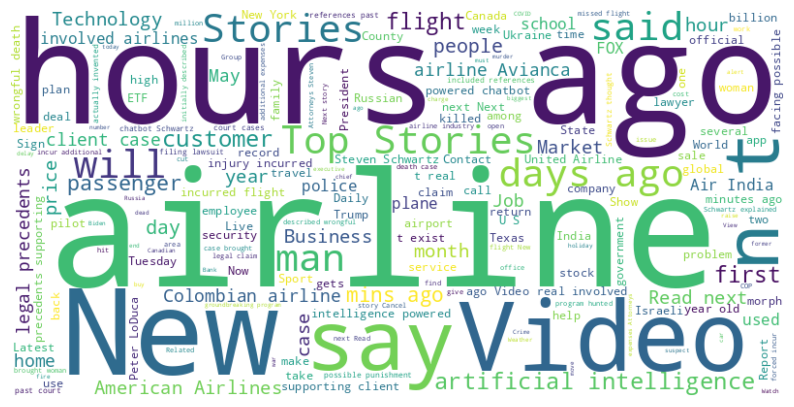

In [ ]:
filtered_df = air_sentence_senti_df[air_sentence_senti_df['ave_article_sentiment'] < 0.35]

all_sentences = []
for sentence_list in filtered_df['cleaned_air_sentences']:
    all_sentences.extend(sentence_list)

text = ' '.join(all_sentences)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
neg_examples = air_sentence_senti_df[air_sentence_senti_df['ave_article_sentiment'] < 0.2]
neg_examples['cleaned_air_sentences'].iloc[0]

['relief Lok Sabha Navneet Kaur Rana the Supreme Court Tuesday stayed the Bombay High Court verdict cancelling the caste certificate the independent lawmaker representing Maharashtra Amravati constituency reserved for scheduled castes days agoThe IndependentIndian passenger arrested for walking baggage belt after being denied boarding airlineAirline says the man shouted staff and created obstacles for other passengers hours agoNewsBrazil Probes Health Ministry Deal Buy Covaxin']

In [ ]:
neg_examples['cleaned_air_sentences'].iloc[36]

['hours ago How one small business brings customers for holiday hours ago KTAL News Daily Headlines months ago What behind full moon names months ago Christmas Day Love Feast hosted First Methodist hours ago Lynn Vance introduces her family holiday tradition hours ago Pinellas sheriff update Christmas Eve shooting hours ago Deputies investigating shooting Largo with possible days ago Children and screen time weeks ago More Videos     More from KTALnews.com Cold moon will light sky Tuesday Mexico army run airline takes the skies with Louisiana family bonds over holiday tamale making']

#### Environment Protection Field

In [ ]:
envi = ['Environmental Issues', 'Environment', 'Environments', 'Pollution']
data_for_new_df = {
    'article_text': df['text'],
    'envi_sentences': batch_filter_sentences(df['text'].tolist(), envi)
}

envi_sentence_senti_df = pd.DataFrame(data_for_new_df)

In [ ]:
envi_sentence_senti_df = envi_sentence_senti_df[envi_sentence_senti_df['envi_sentences'].apply(lambda x: len(x) > 0)]
envi_sentence_senti_df['cleaned_envi_sentences'] = envi_sentence_senti_df['envi_sentences'].apply(clean_sentence_for_sentiment)
envi_sentence_senti_df['envi_sentence_sentiment_probs'] = envi_sentence_senti_df['cleaned_envi_sentences'].apply(analyze_sentence_sentiments)

In [ ]:
envi_sentence_senti_df.head()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,article_text,envi_sentences,cleaned_envi_sentences,envi_sentence_sentiment_probs
0,\n\n \n\nNeoSwap AI Conducts World's First Sma...,[All Photos\nAll Videos\n\n\nMultimedia Galler...,[All Photos All Videos Multimedia Gallery Over...,"[0.5050676225539057, 0.5318116827107238, 0.359..."
1,Artificial Intelligence raises competition con...,[NavigationMenuThe Sydney Morning HeraldSubscr...,[NavigationMenuThe Sydney Morning HeraldSubscr...,[0.5195367140847565]
2,Estate of George Carlin sue company over fake ...,[HubsCrimePoliticsHealthBusinessEducationVoice...,[George Carlin sue company over fake comedy sp...,"[0.36905728092774953, 0.07166284460892139]"
3,\n\nAll Hawaii News: Congressional hearing Tue...,[Congressional hearing Tuesday on helicopter t...,[Congressional hearing Tuesday helicopter tour...,"[0.27598152032962026, 0.3818823166354269]"
4,Irish data science and AI start-up Zerve raise...,[Irish DiaryLettersCartoonBusinessBudget 2024E...,[Irish EconomyFarming FoodFinancial PacificMid...,"[0.6429451579268486, 0.6221432381909107]"


In [ ]:
import numpy as np
envi_sentence_senti_df['ave_article_sentiment'] = envi_sentence_senti_df['envi_sentence_sentiment_probs'].apply(lambda x: np.mean(x) if len(x) > 0 else np.nan)
envi_sentence_senti_df = envi_sentence_senti_df.sort_values(by='ave_article_sentiment', ascending=False)

In [ ]:
overall_average_sentiment = envi_sentence_senti_df['ave_article_sentiment'].mean()

print("Overall Average Sentiment Around Environment Domain:", overall_average_sentiment)

Overall Average Sentiment Around Environment Domain: 0.49430183564472036


In [ ]:
percentage_less_than_05 = (len(envi_sentence_senti_df[envi_sentence_senti_df['ave_article_sentiment'] < 0.5]) / len(envi_sentence_senti_df)) * 100

print(f"Percentage of Negative Sentiment Around Environment Domain: {percentage_less_than_05:.2f}%")

Percentage of Negative Sentiment Around Environment Domain: 56.02%


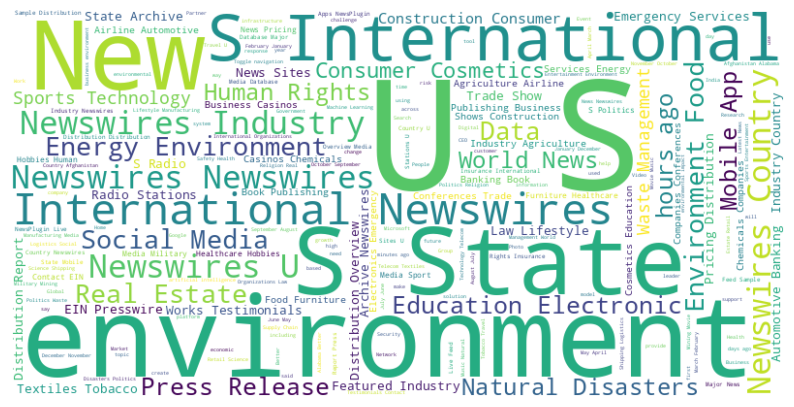

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
filtered_df = envi_sentence_senti_df[envi_sentence_senti_df['ave_article_sentiment'] < 0.4]

all_sentences = []
for sentence_list in filtered_df['cleaned_envi_sentences']:
    all_sentences.extend(sentence_list)

text = ' '.join(all_sentences)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
neg_examples = envi_sentence_senti_df[envi_sentence_senti_df['ave_article_sentiment'] < 0.2]

In [ ]:
neg_examples['cleaned_envi_sentences'].iloc[13]

array(['Not only much still unclear about important issues such environmental impact bias and the ethics OpenAI ...'],
      dtype=object)